![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTCAHq0A4OIckeCHwD_Y8oXi5mj7wcpgMjf5Q&s)

# PI : Décomposeur Audio

## Membres du groupe : LENOBLE Louis, SANSON Dylan, ETIENNE Maxime, BAVOUX Thomas

### Introduction

   Dans le cadre de nos études en troisième année à l'INSA Rouen Normandie au sein du département ITI, nous avons reçu l'opportunité de participer au Projet Integratif de Décomposeur Audio. Celui-ci vise à renforcer et développer des compétences que nous avons abordé en cours. Dès lors, notre objectif était de concevoir un outil permettant de lire un fichier audio comportant plusieurs sources sonores et des les séparer. A terme, nous voulions pouvoir lire les sources de manière indépendante.
   
Dans un cadre plus général, c'est un problème connu et qui fait l'objet de recherches depuis de nombreuses années. En effet, la séparation de source est utilisé dans un large panel de domaines tels que :

 - **Audio et Musique :**
 
Remixage (séparer instruments et voix).

Karaoké (extraire la voix pour obtenir une version instrumentale).

 - **Audiovisuel et Cinéma :**

Post-production (suppression des bruits indésirables).

Doublage (isoler la voix originale pour la remplacer).

 - **Reconnaissance vocale :**

Assistants vocaux (extraction de la voix dans un environnement bruité).

Multi-parleurs (distinguer plusieurs locuteurs dans une réunion).

 - **Santé et Médecine :**

Appareils auditifs (amélioration de la parole dans le bruit).

 - **Télécommunications :**

Suppression de bruit (amélioration des appels).

...

Bien qu'aujourd'hui, l'intelligence artificielle soit une solution très efficace et de plus en plus répendue, nous tenterons ici de trouver une autre solution.

### Principe de résolution

Afin de résoudre ce problème nous avons distingué quatres grandes étapes qui vont nous servir de lignes directrices pour ce projet:

- **Récupération et visualisation des sons**
 
Importer des sons à étudier

 - **Visualisation fréquentielle du son**

Etude et élaboration d'un spectrogramme

 - **Factorisation du spectrogramme**

Trouver et comprendre une méthode de factorisation efficace

Optimiser la méthode de factorisation

 - **Reconstruction des sources indépendantes**

Créer des fichiers audios des différentes sources

### I) Importer les données

####    1) Charger les données

In [47]:
# Bibliothèques
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sp
from scipy.io.wavfile import read, write
from scipy.fft import fft, fftshift
# Librosa
import librosa
import librosa.display
from sklearn.decomposition import NMF

In [48]:
#on charge les données
CHEMIN_ENTREE = "sourcesAudio"
data_piano, Fe_piano = librosa.load(f"{CHEMIN_ENTREE}/piano_mix.wav", sr = None)
data_cheval, Fe_cheval = librosa.load(f"{CHEMIN_ENTREE}/horse_and_chat.wav", sr = None)
data_violon, Fe_violon = librosa.load(f"{CHEMIN_ENTREE}/01-AchGottundHerr.wav", sr = None)

#### 2) Ploter les données

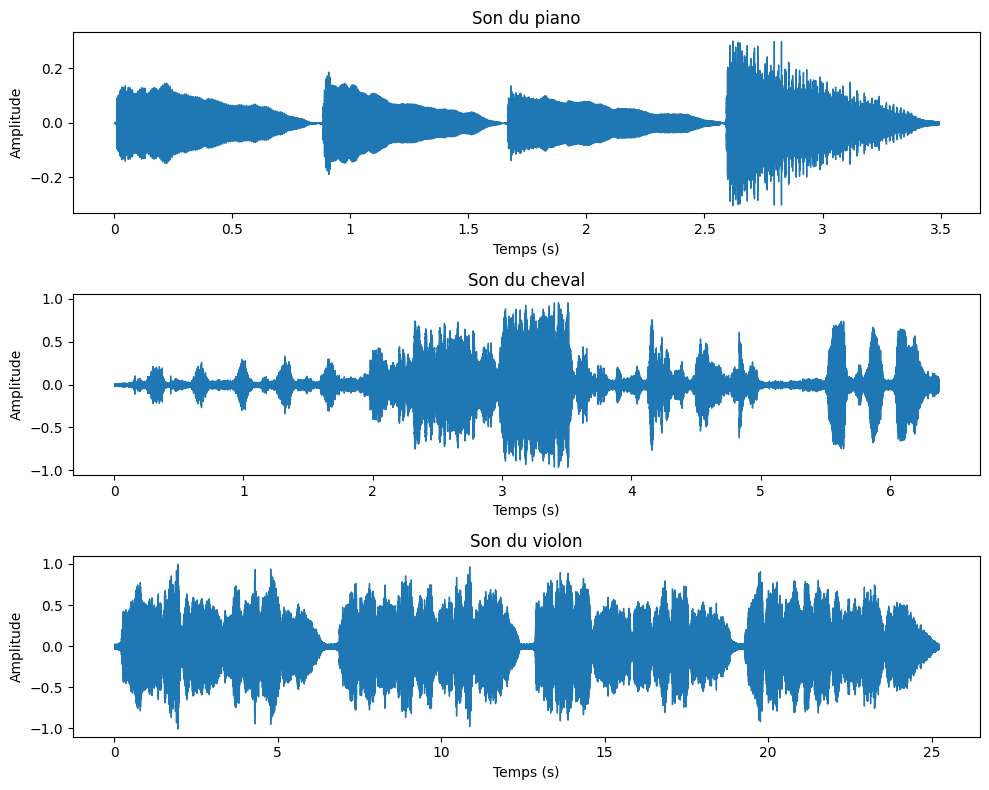

In [49]:
#on plot les son en fonction du temps
fig, ax = plt.subplots(3, 1, figsize=(10, 8))
librosa.display.waveshow(data_piano, sr=Fe_piano, ax=ax[0],axis='time')
ax[0].set_xlabel("Temps (s)")
ax[0].set_ylabel("Amplitude")
ax[0].set(title='Son du piano', xlabel='Temps (s)', ylabel='Amplitude')

librosa.display.waveshow(data_cheval, sr=Fe_cheval, ax=ax[1],axis='time')
ax[1].set(title='Son du cheval', xlabel='Temps (s)', ylabel='Amplitude')

librosa.display.waveshow(data_violon, sr=Fe_violon, ax=ax[2],axis='time')
ax[2].set(title='Son du violon', xlabel='Temps (s)', ylabel='Amplitude')

plt.tight_layout()
plt.show()

### II) Création du spectrogramme

Définition : Un spectrogramme est une représentation visuelle de l'évolution des fréquences d'un son en fonction du temps.

Pour créer un spectrogramme nous utiliserons la stft.
La stft (short term fourier transform) ou transformée de Fourier à court terme en français est une transformée de Fourier spéciale réalisée sur un signal.

Le principe est de diviser le signal en un certains nombre de segments et de réaliser une transformée de Fourier sur chacun de ces segments. La longueur de ces segments est définie par le paramètre n_fft.

Mais lors de cette transformée de Fourier des problèmes de continuité peuvent se poser entre 2 segments, rendant l'affichage du spectrogramme moins lisible. Pour cela il est possible de faire en sorte que les transformées de Fourier de 2 segments consécutifs prennent certains éléments en commun, superposant ainsi ces valeurs lors de la transformée de Fourier. Ceci est géré par le paramètre hop_length.

Il est aussi possible d'utiliser une fenêtre spéciale grâce au paramètre window, si c'est ce le cas chaque segment va être multiplié par cette fenêtre. Souvent celle ci est une fonction dont les valeurs du début et celle de fin sont proches 0, permettant ainsi de minimiser les effets de discontinuité d'autant plus.

Une grande fenêtre permet une bonne résolution fréquentielle mais une mauvaise résolution temporelle comme montré sur les différents spectrogrammes.
Une petite taille de fenêtre permet d'obtenir une bonne résolution temporelle mais une mauvaise résolution fréquentielle comme avec l'exemple des ondelettes montré plus tard.

#### 1) Spectrogramme : mieux comprendre les differentes composantes (avec sklearn)

On commence par utiliser la fonction pour récupérer un spectrogramme. Celui ci ne subit aucun traitement et peut être amélioré.

In [50]:
def spectrogramme(data,Fe,titre) : 
    frequences, temps, magnitude = sp.spectrogram(data,Fe)
    plt.figure(figsize=(10,6))
    epsilon = 1.0e-15
    plt.pcolormesh(temps,frequences,10*np.log10((magnitude+epsilon)/np.max(magnitude)))
    plt.xlabel=('temps [s]')
    plt.ylabel=('Frequences [Hz]')
    plt.colorbar(label='intensite [dB]')
    plt.title(titre)
    plt.show
    return (frequences, temps, magnitude)

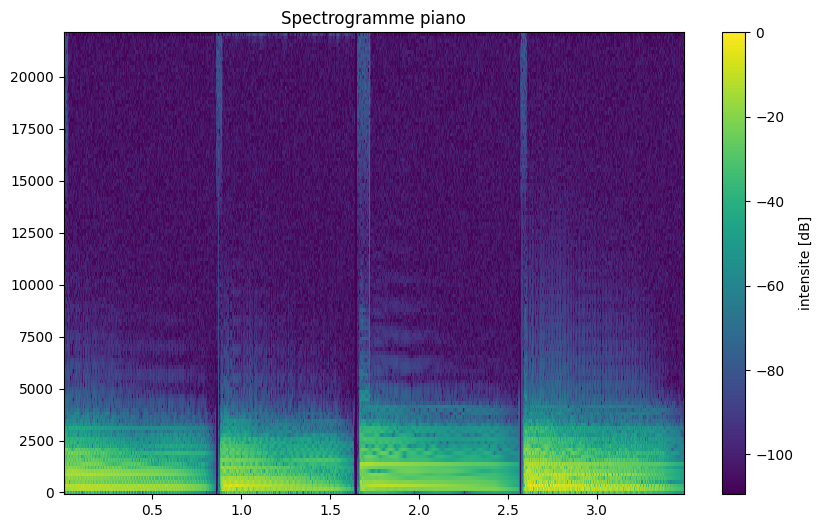

In [51]:
freqPiano, tempsPiano, magnitude_Piano = spectrogramme(data_piano,Fe_piano,'Spectrogramme piano')

On peut remarquer que plusieurs optimisations peuvent être appliquées afin d'améliorer les mesures et la lisibilté du spectrogramme:

   - On remarque que les principales fréquences du son ne dépassent pas 3000Hz. On réduit alors la fenêtre.
    
   - Pour mieux comprendre quelles sont les fréquences qui jouent un rôle important dans ce spectrogramme, nous pouvons réduire l'échelle à -80dB au lieu de -110dB.
    
   - Comme la taille de la fenêtre dans laquelle nous travaillons est réduite, nous devons améliorer la précision des fréquences que nous allons mesurer. Pour cela nous allons augmenter la taille des fenêtres glissantes. En contrepartie, nous aurons moins d'échantillons au cours du temps.


In [52]:
def spectrogramme(data,Fe,titre) : 
    frequences, temps, magnitude = sp.spectrogram(data,Fe, nperseg=4500,noverlap=0)
    plt.figure(figsize=(10,6))
    plt.pcolormesh(temps,frequences,10*np.log10(magnitude/np.max(magnitude)))
    plt.xlabel=('temps [s]')
    plt.ylabel=('Frequences [Hz]')
    plt.ylim(0,2700)
    plt.clim(-80,0)
    plt.colorbar(label='intensite [dB]')
    plt.title(titre)
    plt.show
    return (frequences, temps, magnitude)

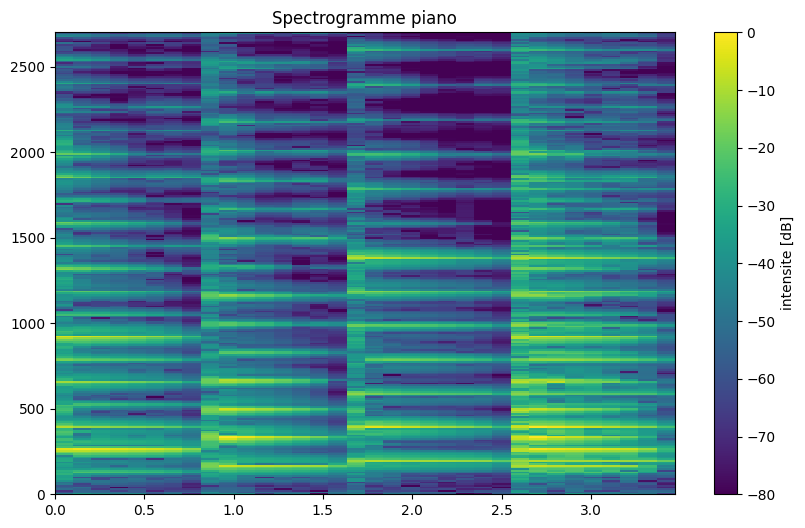

In [53]:
freqPiano, tempsPiano, magnitude_Piano = spectrogramme(data_piano,Fe_piano,'Spectrogramme piano')


Nous pouvons maintenant améliorer le résultat en utilisant un type de fenêtre différent et superposer les échantillons pour avoir une meilleure précision sur le temps.

In [54]:
def spectrogramme(data,Fe,titre) : 
    fenetre =sp.get_window('hamming',8000)
    frequences, temps, magnitude = sp.spectrogram(data,Fe,window=fenetre,noverlap=5000,)
    plt.figure(figsize=(10,6))
    plt.pcolormesh(temps,frequences,10*np.log10(magnitude/np.max(magnitude)))
    plt.xlabel=('temps [s]')
    plt.ylabel=('Frequences [Hz]')
    plt.colorbar(label='intensite [dB]')
    plt.ylim(0,2700)
    plt.clim(-80,0)
    plt.title(titre)
    plt.show
    return (frequences, temps, magnitude)

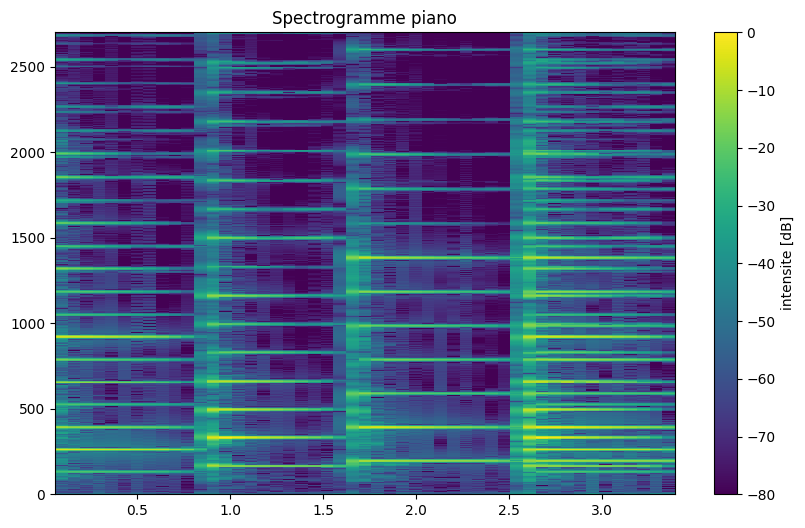

In [55]:
freqPiano, tempsPiano, magnitude_Piano = spectrogramme(data_piano,Fe_piano,'Spectrogramme piano')

#### 2) Spectrogramme avec librosa

Maintenant que nous avons compris comment améliorer notre spectrogramme nous allons utiliser librosa. En effet, cette librairie génère automatiquement des spectrogrammes de bonne qualité.

In [56]:
data_piano2, Fe_piano2 = librosa.load(f"{CHEMIN_ENTREE}/piano_mix.wav", sr = 5512)

In [57]:
def spectrogramme_librosa(data,Fe,taille_fenetre,taille_superposee,limite_y):
    
    #On applique la Short Term Fourier Transform = Transformée de fourier à fenetre glissante.
    stft = librosa.stft(data, n_fft=taille_fenetre, hop_length=taille_superposee)

    #On calcul la magnitude de la STFT = amplitude.
    stft_magnitude = np.abs(stft)

    #On calcul la phase de la STFT
    stft_angle = np.angle(stft)

    #On convertie l'amplitude en dB
    gain = librosa.amplitude_to_db(stft_magnitude, ref=np.max)

    #On plot le spectrogramme
    fig, ax = plt.subplots(figsize=(10, 4))
    librosa.display.specshow(gain,y_axis='hz',sr=Fe,hop_length=taille_superposee,x_axis='time',cmap=None)
    plt.title('Audio Spectrogram')
    plt.colorbar(label='Amplitude (dB)', ax=ax)
    plt.ylim(0,limite_y)
    plt.show()
    return(stft,stft_magnitude,stft_angle,gain)


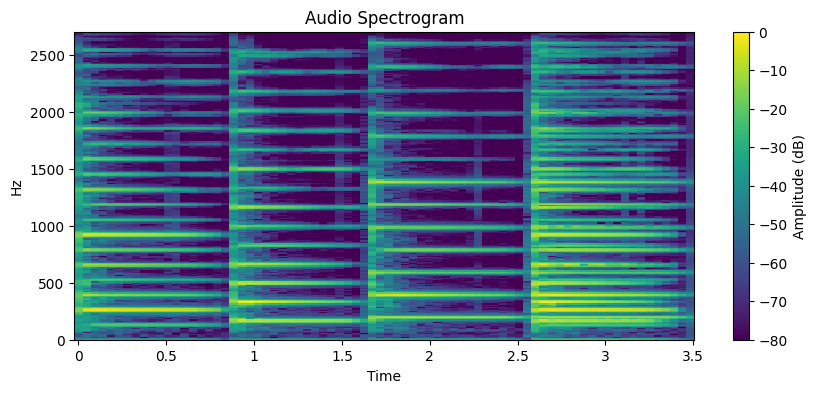

In [58]:
stft_piano,V_piano,phase_piano,gain_piano = spectrogramme_librosa(data_piano2,Fe_piano2,512,256,2700)

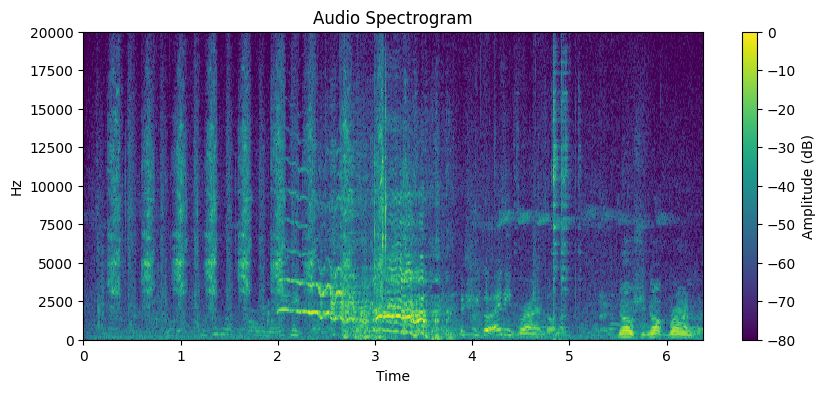

In [59]:
stft_cheval,V_cheval,phase_cheval,gain_cheval = spectrogramme_librosa(data_cheval,Fe_cheval,512,256,20000)

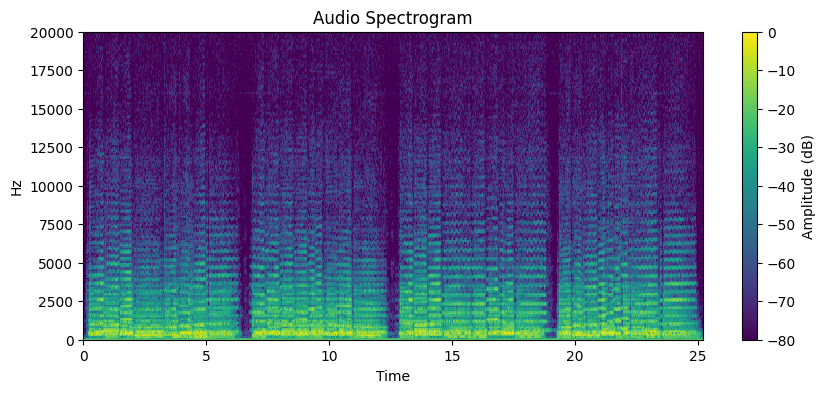

In [60]:
stft_violon,V_violon,phase_violon,gain_violon =spectrogramme_librosa(data_violon,Fe_violon,512,256,20000)

#### 3) Bonus : spectrogramme en utilisant les ondelettes.

Depuis le début nous représentons des spectrogrammes grâce aux transformées de fouriers à fenêtre glissante. Cela veut dire que la fenêtre dans laquelle nous effectuons notre transformée de fourier ne varie jamais. Bien que cette méthode reste très satisfaisante pour la décomposition du son, celle ci comporte quelques defauts. En effet, elle ne réussit pas à capter efficacement les détails du son (variations rapides des fréquences). Pour cela, nous pouvons appliquer la (CWT) "continuous wavelet transform" soit la transformée continue par ondelette. Cette méthode offre une bonne résolution à la fois en temps et en fréquence et qui est plus flexible que la STFT pour capturer des détails à différentes échelles de fréquence.

In [61]:
import pywt

In [62]:
son = data_piano #son a analyser
echelle = np.arange(5,175) #permet de choisir la plage de fréquence sur laquelle analyser le son
ondelette = 'cmor1.5-1.0' #choix du type d'ondelettes
samplingPeriod_piano = 1 / Fe_piano #periode d'echantillonnage
duree_piano = len(data_piano) / Fe_piano #duree du signal
tps_piano = np.linspace(0, duree_piano, son.size) #temps du signal

In [63]:
cwtmatr, freqs = pywt.cwt(son, echelle, ondelette, sampling_period = samplingPeriod_piano) #faire la decomposition en
#ondelettes continue
cwtmatr = np.abs(cwtmatr) #on enleve les nombres complexes
print(np.min(freqs), np.max(freqs)) #affiche la plage de frequence

253.44827586206895 8820.0


(0.0, 2500.0)

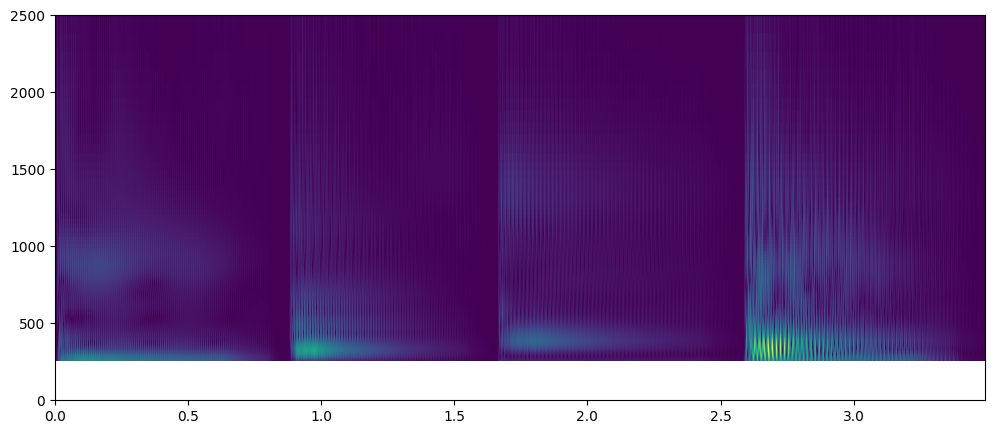

In [64]:
plt.figure(figsize=(12,5))
plt.pcolormesh(tps_piano, freqs, cwtmatr)
#ax.set_yscale("log")
plt.ylim(0, 2500)

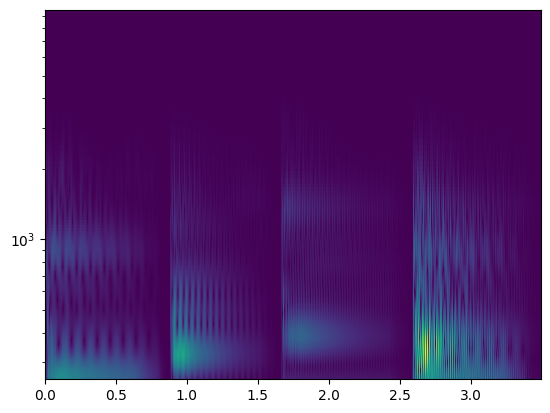

In [65]:
fig, ax = plt.subplots()
#plt.figure(figsize=(12,5))
graph = ax.pcolormesh(tps_piano, freqs, cwtmatr)
ax.set_yscale("log")
#plt.ylim(0, 10000)
plt.show()

Bien que ce spectrogramme offre plus de détails, il est bien plus couteux en terme de calculs et plus difficile à implémenter dans la décomposition. Pour la suite, nous nous contenterons des données trouvées dans la partie 2).

#### 3) Bonus : STFT à la main.

Maintenant que nous avons compris comment former un spectrogramme à l'aide d'outils mathématiques, nous vous proposons de créer ces sprectrogrammes à l'aide de la transformée de fourier, pour les 3 audios.\
Après avoir essayé avec plusieurs paramètres de taille de fenêtre et de chevauchement, c'est avec *2048* et *1536* qu'on a obtenu les résultats les plus concluants, notamment sur le plan des fréquences comme le précise le tableau ci-dessous.
| Taille de la fenêtre (N) | Chevauchement (%) | Chevauchement (échantillons) | Utilisation recommandée                     |
|---------------------------|-------------------|------------------------------|---------------------------------------------|
| 256                       | 75%              | 192                          | Sons rapides comme les percussions (bonne résolution temporelle). |
| 1024                      | 50%              | 512                          | Sons intermédiaires comme la voix humaine (équilibre entre résolution temporelle et fréquentielle). |
| 2048                      | 75%              | 1536                         | Sons longs ou lents comme le violon (meilleure résolution fréquentielle). |

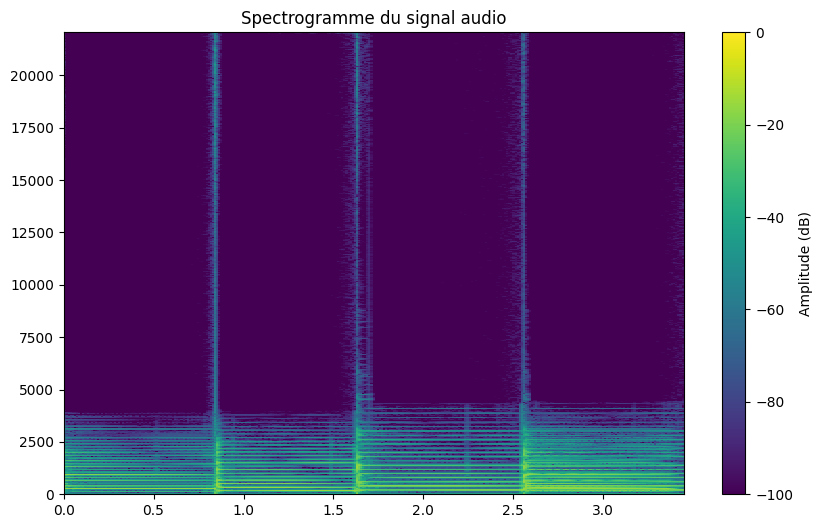

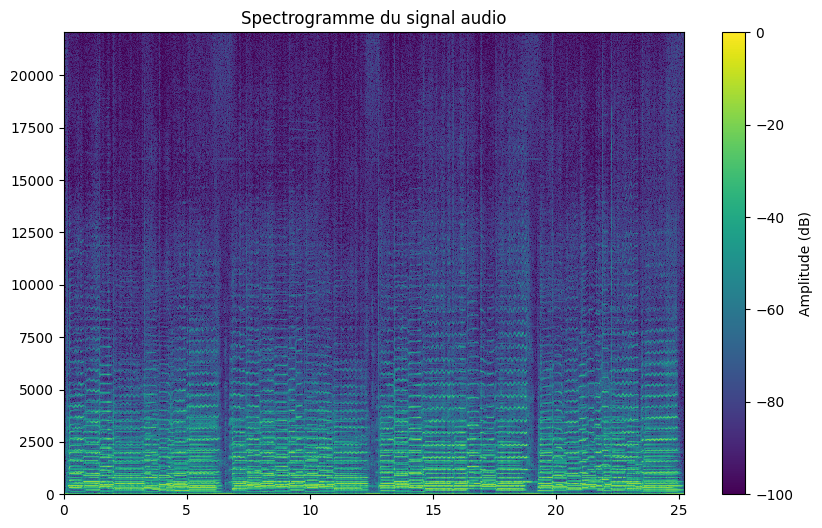

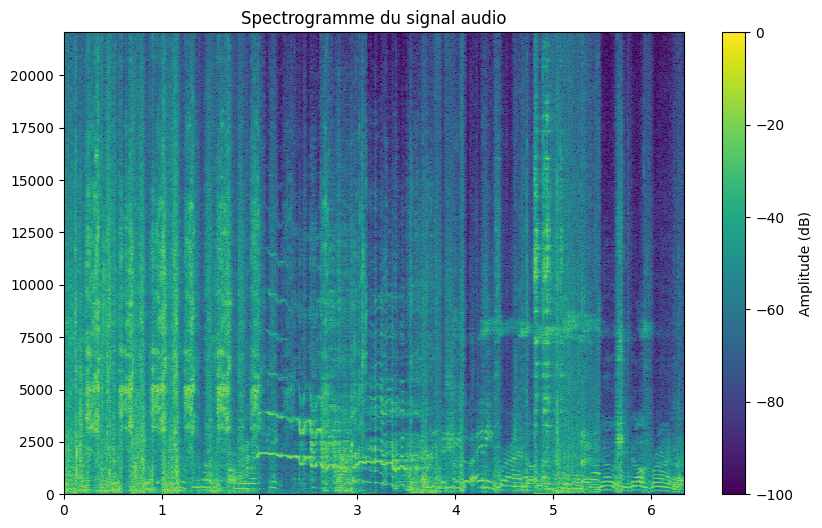

In [66]:
def afficher_spectrogramme_main(donnees, Fe):
    # Gérer le signal stéréo (prendre un canal si nécessaire)
    if len(donnees.shape) == 2:
        donnees = donnees[:, 0]  # Prendre le canal gauche

    # Paramètres
    Te = 1 / Fe           # Période d'échantillonnage
    N = donnees.size      # Taille totale du signal
    fenetre_taille = 2048 # Taille de chaque fenêtre
    chevauchement = 1536  # Chevauchement (75%)
    step = fenetre_taille - chevauchement

    # Calcul du spectrogramme
    spectrogram = []
    for i in range(0, N - fenetre_taille, step):
        segment = donnees[i:i + fenetre_taille]  # Extraction de la fenêtre
        segment_windowed = segment * np.hanning(fenetre_taille)  # Fenêtrage
        fft_segment = fft(segment_windowed) * Te  # FFT
        magn = np.abs(fft_segment[:fenetre_taille // 2]) # Moitié spectre positif
        espilon = 1e-12
        amplitude_db = 20 * np.log10((magn + espilon) / ((np.max(magn) * 6)))
        spectrogram.append(amplitude_db)

    # Conversion en tableau numpy
    spectrogram = np.array(spectrogram).T  # Transposition pour correspondance temps/fréquence
    
    # Création des axes adaptés
    temps = np.linspace(0, (N - fenetre_taille) / Fe, spectrogram.shape[1] + 1)
    frequences = np.linspace(0, Fe / 2, spectrogram.shape[0] + 1)

    # Affichage du spectrogramme
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(temps, frequences, spectrogram, shading='auto', cmap='viridis', vmin=-100, vmax=0)
    plt.title("Spectrogramme du signal audio")
    plt.xlabel=("Temps (s)")
    plt.ylabel=("Fréquence (Hz)")
    plt.colorbar(label="Amplitude (dB)")
    plt.show()

afficher_spectrogramme_main(data_piano, Fe_piano)
afficher_spectrogramme_main(data_violon, Fe_violon)
afficher_spectrogramme_main(data_cheval, Fe_cheval)

### III) Décomposition du son

#### 0) Trouver la bonne méthode

L'objectif de cette partie est de trouver un moyen de séparer notre son en plusieurs sources sonores indépendentes. Pour cela, nous pouvons utiliser le spectrogramme et l'utiliser comme une matrice. Cette matrice sera donc utilisée pour en faire une décomposition et ainsi trouver les composantes du son et leurs activations. Afin de réaliser cette décomposition, plusieurs intuitions peuvent émerger. En effet, nous avons vu en cours d'ananum que de nombreuses méthodes existaient afin de décomposer une matrice. Cependant, il est important de comprendre que ces méthodes n'ont pas toute le même objectif. Nous essayerons alors de déterminer quelle est la stratégie de factorisation la plus adéquate.

Nous pourrions donc penser que les méthodes vu en cours pourraient être une bonne idée de factorisation comme la factorisation LU, PALU, Cholesky ou encore QR. Regardons alors en quoi ces méthodes ne conviennent pas pour cet exercice:

 - **LU / PALU :**

Rapelons premièrement que la décomposition LU est une décomposition de matrices carrés et qu'il est presque impossible d'avoir un spectrogramme respectant cette condition. Ensuite, il est évident que cette méthode ne convient pas car cette méthode vise à optimiser la résolution d'une équation linéaire. 

 - **Cholesky :**

La décomposition Cholesky est utilisée pour factoriser une matrice symétrique et définie positive, en un produit de matrices triangulaires inférieures. Elle est utilisée dans la résolution de systèmes d'équations et l'inversion de matrices. Le spectrogramme n'étant pas symétrique (dans la majorité des cas) et ne cherchant pas à le factoriser en deux matrice inferieure, nous ne choisiront pas cette stratégie. 

 - **QR :**

La décomposition QR est, comme les décompositions LU et Cholesky, une méthode afin d'optimiser la résolution d'équations linéaire. Cette méthode ne sera donc pas retenue.

Maintenant que nous avons testé les méthodes vues en cours, cherchons d'autres factorisations :

- **ACP :**

L'ACP est une méthode utilisée pour la décomposition de données complexes, permettant de réduire la dimensionnalité tout en préservant l'essentiel des informations. Elle est particulièrement utile pour la compression de données, la classification, et l'extraction de caractéristiques dominantes dans le signal. Toutefois, elle présente des limites dans la capture des relations non linéaires. Le son étant un signal complexe, l'ACP ne nous sera pas utile dans ce cas. Nous pourrions cependant utiliser l'ACP afin de compresser un son et le rendre ainsi moins volumineux.

 - **NMF "Non-negative matrix factorization" soit la factorisation par matrices non-négatives:**

La NMF est basée sur l'idée que les données peuvent être décomposées en facteurs dont tous les éléments sont non négatifs. C'est une contrainte importante qui se révèle très naturelle pour le traitement du son. En effet, les amplitudes des signaux sonores sont toujours positives ou nulles (en termes de puissance ou d'intensité sonore). Il n'a pas de sens que des composantes de l'audio aient des valeurs négatives, car les amplitudes de fréquence (dans un spectrogramme par exemple) sont toujours positives.

Cette méthode nous convient alors parfaitement car elle ne se base pas sur une relation linéaire du son et préserve le caractère positif des différentes composantes et activations.

Maintenant que nous avons trouvé quelle factorisation nous voulons effectuer, il nous reste à comprendre comment celle ci peut être calculée. Lors de nos recherches, nous avons trouver deux stratégies différentes et plutôt équivalentes: 
- L'algorithme multiplicatif standard de la NMF.
- L'ALS "Alternate Least Square algorithm" soit l'algorithme des moindres carrés alternés. L'idée principale est de fixer alternativement l'une des deux matrices (W ou H) et de résoudre un problème de moindres carrés pour l'autre, puis de passer à l'autre matrice et de répéter l'opération.


Ici, nous étudierons plus particulièrement la méthode multiplicative de la NMF.

#### 1) Qu'est ce que la NMF ?

Le but de la NMF est de pouvoir factoriser une matrice V en deux matrices non négatives W et H, tel que W@H approxime V.

Definition : Une matrice non négative est une matrice dont tous les éléments sont supérieurs ou égaux à zéro. 

Matrice V :  Dans le contexte du son, V représente typiquement un spectrogramme de l'audio.

Matrice W :  Elle contient les "composantes" qui sont combinées pour reconstruire les sons observés. En d'autres termes, les colonnes de W sont les éléments qui composent les différentes sources. W aura donc le même nombre de colonne que de source.

Matrice H : C'est la matrice qui décrit comment les bases (de W) sont combinées pour recréer la matrice V. Les lignes de H indiquent les poids ou coefficients d'activation des bases dans W pour chaque "échantillon" de temps ou de fréquence de la matrice V.

Les mathématiciens derrière la NMF:


![Sebastian Seung](https://i.harperapps.com/authors/80236/x230.JPG)
![Daniel Lee](https://www.grasp.upenn.edu/wp-content/uploads/2020/12/image002.png)

#### 2) Une première représentation de la NMF :

Afin de mieux comprendre ce que nous cherchons, nous vous proposons de visualiser le résultat de la NMF pour décomposer le son du piano avec scipy.

In [67]:
def afficher_H(H, x_max, rank):
    plt.figure(figsize=(13,3))
    plt.pcolormesh(np.linspace(0, x_max, np.shape(H)[1]), np.arange(1,rank+1), H, cmap=None)
    plt.xlabel=('Temps [s]')
    plt.ylabel=('Sources')
    plt.title('Activations temporelles')
    plt.yticks(np.arange(1,rank+1))
    plt.show()

In [68]:
def afficher_W(W, y_max, rank):
    plt.figure(figsize=(4,9))
    plt.pcolormesh(np.arange(1,rank+1), np.linspace(0, y_max, np.shape(W)[0]), W, cmap=None)
    plt.xlabel=('Sources')
    plt.ylabel=('Frequences[Hz]')
    plt.title('Activations fréquentielles')
    plt.xticks(np.arange(1,rank+1))
    plt.show()

Matrice W :


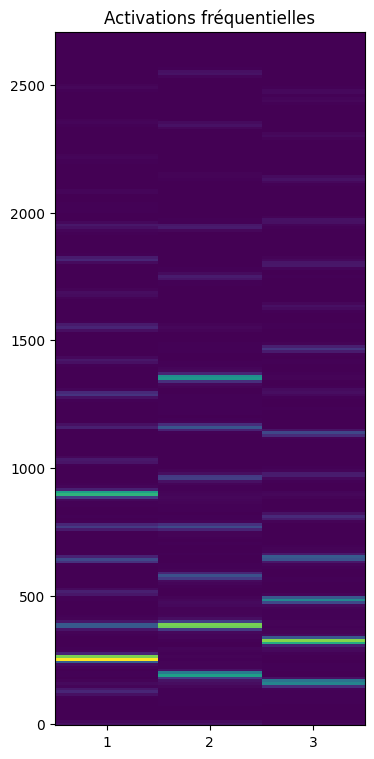


Matrice H :


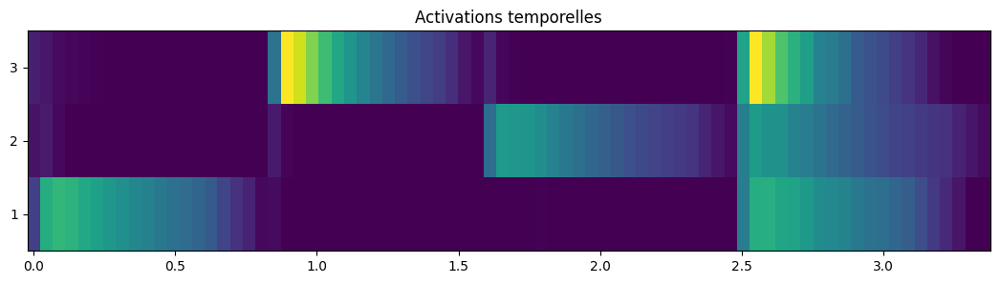

Avec 28 iterations on obtient une erreur de 17.751482009887695


In [69]:
# On défini le nombre de source:
n_sources = 3

# Initialisation de la décomposition NMF
model = NMF(n_components=n_sources, init='random', random_state=42)


# Appliquer la décomposition
W_piano = model.fit_transform(V_piano)
H_piano = model.components_

# Affichage des résultats
print("Matrice W :")
afficher_W(W_piano, 2700,3)

print("\nMatrice H :")
afficher_H(H_piano, tempsPiano[-1],3)

print(f"Avec {model.n_iter_} iterations on obtient une erreur de {model.reconstruction_err_}")

#### 3) Qu'est ce que l'algorithme derrière la NMF ?

Le problème de la NMF peut être formulé comme un problème d'approximation de matrice :
min⁡ ∥V−WH∥²

Pour cela nous pourrions faire une déscente de gradient. Cependant, le fait de devoir toujours garder W et H non négative rend la descente de gradient impossible.

Ainsi, pour trouver W et H nous sommes obligé d'utiliser l'algorithme du gradient basé sur des mises à jour multiplicatives qui ajuste les valeurs à chaque itération. La formule associée à cet algorithme est :

$x_{n+1}$ = $x_{n}$ − $\gamma$ * ∇F(x(n))

Finalement, le pas optimal $\gamma$ doit être égale à :

Pour H :   $\frac{H}{(W.T@W@H)}$

Pour W : $\frac{W} {(W @ H @ H.T)}$

Ici, la mise à jour de H va donc être:

$H(i,j)_{n+1}$ = $H(i,j)_{n}$ * $\frac{(W.T @ V)(i,j)}{(W.T @ W @ H)(i,j)+ϵ)}$

ϵ : est ajouter afin d'éviter les divisions par 0

La présence de W.T@V dans le numérateur vise à augmenter les éléments de H qui contribuent plus fortement à la reconstruction de V, tandis que W.T @ W @ H dans le dénominateur sert à corriger les termes surajustés et à maintenir la stabilité du processus.

De manière similaire, la mise à jour de W est donnée par :

$W(i,j)_{n+1}$ = $W(i,j)_{n}$ * $\frac{(V @ H.T)(i,j)}{(W @ H @ H.T)(i,j)+ϵ)}$

Cette mise à jour ajuste les valeurs de W de la même manière, en augmentant les éléments qui contribuent positivement à la reconstruction de V et en réduisant ceux qui sont trop importants par rapport à la structure actuelle de W@H.

- **Attention** : Cette méthode va nous permettre de trouver un minimum local et non un minimum global.

Voici une vidéo qui récapitule ce qui a été dit :
[Vidéo sur la NMF](https://www.youtube.com/watch?v=o4pPTwsd-5M)

In [70]:
def initialisation_aleatoire(V, nb_sources):
    n = V.shape[0]
    m = V.shape[1]
    W = np.random.uniform(1, 2, (n, nb_sources))
    H = np.random.uniform(1, 2, (nb_sources, m))
    return W, H


def multiplicative_update(V, nb_sources, max_iter, norme):
    W, H = initialisation_aleatoire(V, nb_sources)

    norms = []
    epsilon = 1.0e-10
    for _ in range(max_iter):
        # Update H
        H *= (W.T @ V) / (W.T @ W @ H + epsilon) 
        # Update W
        W *= (V @ H.T) / (W @ H @ H.T + epsilon)

        norm = np.linalg.norm(V - W @ H, norme)
        norms.append(norm)

    return W, H, norms

Voici un exemple d'utilisation (toujours avec le piano):

Initialisation aléatoire


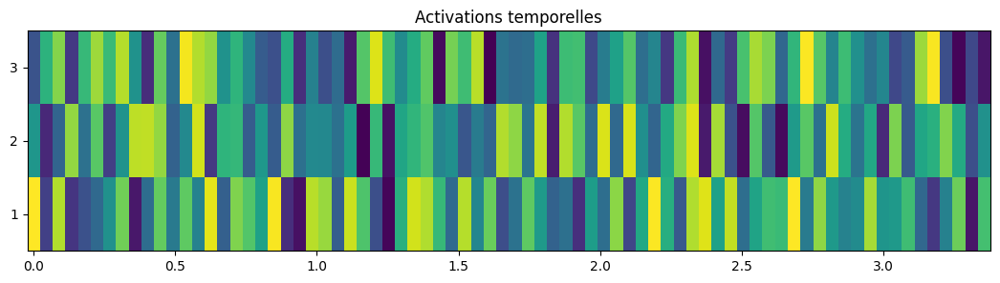

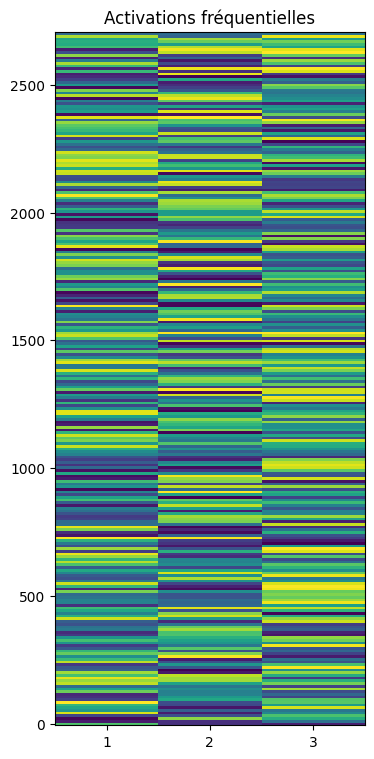


Mise à jour multiplicative


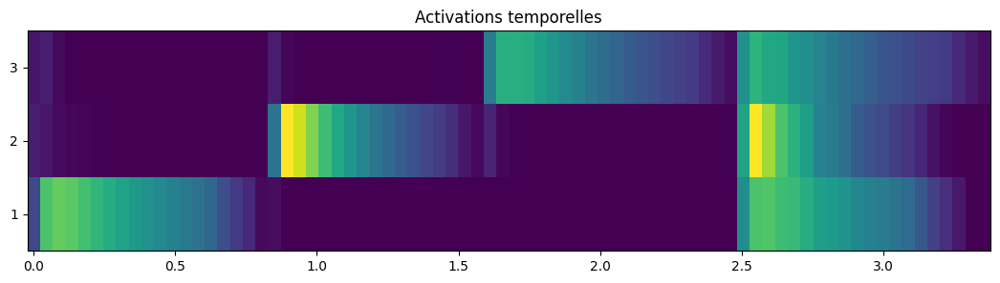

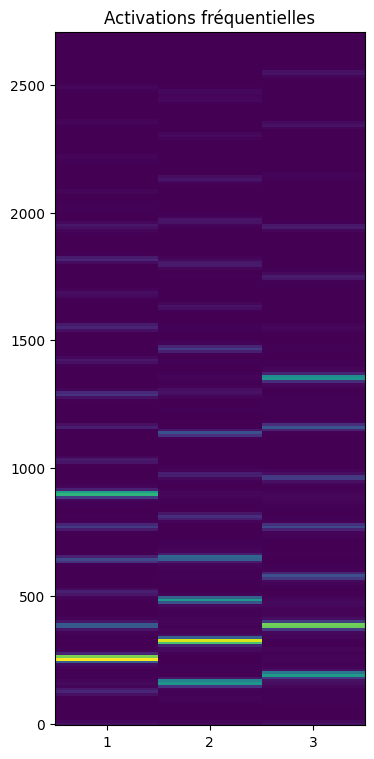

Avec 1000 itérations on obtient une erreur de 17.751574298986053


In [71]:
rank = 3
W_rand, H_rand = initialisation_aleatoire(V_piano, rank)
print("Initialisation aléatoire")
afficher_H(H_rand, tempsPiano[-1],3)
afficher_W(W_rand, 2700,3)
print()

# Test multiplicative_update
max_iter = 1000
W_piano2, H_piano2, norms = multiplicative_update(V_piano, rank, max_iter,'fro')
print("Mise à jour multiplicative")
afficher_H(H_piano2, tempsPiano[-1],3)
afficher_W(W_piano2, 2700,3)
print(f"Avec {max_iter} itérations on obtient une erreur de {norms[-1]}")

#### 4) Optimisation de cet algorithme : fonction de coût

Afin d'évaluer la qualité de notre résultat, nous pouvons utiliser des fonction de coût. Cela nous permet d'établir un seuil de précision du resultat. Voici différentes fonctions de coût:
- l'erreur quadratique, soit la norme de Frobenius entre V et W@H.
- la divergence de Kullback-Leibler
- la fonction de cout itakura saito

La mise à jour des matrices W et H peuvent ainsi varier :

Mise à jour de H :
$H_{n+1}$ = $H_{n}$ * $\frac{(W.T @ ((W @ H)**(\beta-2) @ V)}{(W.T @ ((W @ H)**(\beta-1))+ϵ)}$

Mise à jour de W :
$W_{n+1}$ = $W_{n}$ * $\frac{(((W @ H)**(\beta-2)) @ V @ H.T)}{((W @ H)**(\beta-1)) @ H.T +ϵ)}$

Cet algorithme offre une plus grande flexibilité par rapport à l'algorithme précédent, car nous pouvons choisir entre différentes divergences (β=0, β=1, β=2). Cela nous permet d'adapter l'algorithme à différents types de données et de problèmes. Par exemple, la divergence de Kullback-Leibler est souvent plus adaptée pour des données qui représentent des distributions de probabilité, tandis que la divergence d'Itakura-Saito est plus appropriée pour des applications de séparation de sources.


In [72]:
def divergence(V,W,H,beta):
    if beta == 0 : return np.sum( V/(W@H) - np.log(V/(W@H)) -1 )
    
    if beta == 1 : return np.sum( V*np.log(V/(W@H)) + (W@H - V))
    
    if beta == 2 : return 1/2*np.linalg.norm(W@H-V)

def NMF_div(V, S,beta,seuil,MAXITER): 
    
    compteur = 0
    fonction_cout = []
    beta_divergence = 1
    
    W,H = initialisation_aleatoire(V,S)

    while beta_divergence >= seuil and compteur <= MAXITER:
        
        H *= (W.T@(((W@H)**(beta-2))*V))/(W.T@((W@H)**(beta-1)) + 10e-10)
        W *= (((W@H)**(beta-2)*V)@H.T)/((W@H)**(beta-1)@H.T + 10e-10)
        
        beta_divergence =  divergence(V,W,H,beta)
        fonction_cout.append(beta_divergence)
        compteur += 1
       
    return W,H,fonction_cout

Voici un exemple d'application de cette optimisation :

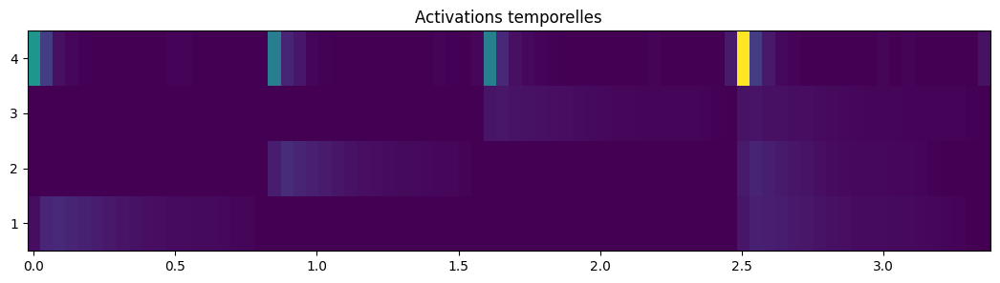

L'ordre des différentes activations temporelles dépend de l'initialisation de H
En relançant plusieurs fois cette cellule les graphique de H et W changent avec un ordre de 
lignes et colonnes différent


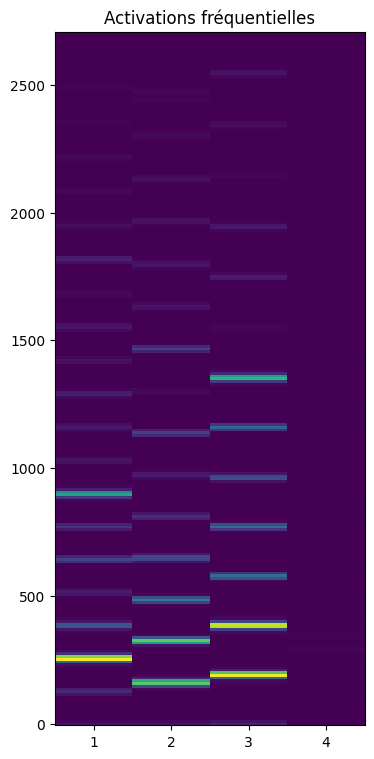

Le cout est très rapidement minimisé


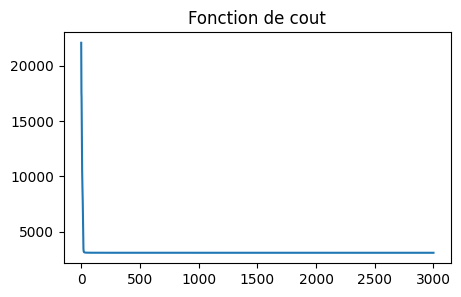

In [73]:
beta = 0 #itakura saito
S = 4

W_piano3, H_piano3, fonction_cout = NMF_div(V_piano,S,beta,0.05,3000) 
afficher_H(H_piano3, tempsPiano[-1],S)
print("L'ordre des différentes activations temporelles dépend de l'initialisation de H")
print("En relançant plusieurs fois cette cellule les graphique de H et W changent avec un ordre de \nlignes et colonnes différent")
afficher_W(W_piano3, 2700,S)
plt.figure(figsize=(5,3))
plt.plot(fonction_cout)
plt.title('Fonction de cout')
plt.xlabel=('Nombre d''iteration')
plt.ylabel=(f"Beta Divergence for beta = {beta} ")
print("Le cout est très rapidement minimisé")

#### 5) Optimisation de cet algorithme : initialisation

Maintenant que notre algorithme de factorisation est bien défini. Nous pouvons nous occuper de l'initialisation de nos matrices W et H. En effet, depuis le debut nous les initialisons aléatoirement. Cependant, plusieurs méthodes existent afin d'initialiser correctement nos matrices et alors impacter la qualité de la décomposition :
- Si l'initialisation est mal choisie, l'algorithme peut converger vers un minimum local qui n'est pas la solution optimale.
- Une initialisation efficace peut accélérer la convergence de l'algorithme

Voici différentes manières d'initialiser nos matrices : 
- plusieurs initialisations aléatoires de W et H, le meilleur ajustement est conservé
- (NNDSVD) "non-negative double singular value decomposition" qui utilise la décomposition en valeurs singulières (SVD) et utilise les valeurs et vecteurs propres pour créer des matrices initiales non négatives W et H.
- une classification (k-means) des lignes ou des colonnes. C'est un algorithme de clustering qui permet de partitionner un ensemble de données en un certain nombre k de groupes (ou de clusters). Chaque groupe est caractérisé par son centre, qui est la moyenne des points de données qui lui sont assignés. L'algorithme cherche à minimiser la somme des distances au carré entre chaque point de données et le centre du cluster auquel il appartient.

Finalement, voici un schéma qui répertorie l'ensemble des initialisations possibles pour réaliser une NMF :

![Daniel Lee](https://media.springernature.com/lw1200/springer-static/image/art%3A10.1007%2Fs41060-022-00370-9/MediaObjects/41060_2022_370_Fig1_HTML.png)

Ici, nous nous concentrerons princiaplement sur la NNDSVD.

In [74]:
def nndsvd(V, rang):
    
    u, s, v = np.linalg.svd(V, full_matrices=False)
    v = v.T
    w = np.zeros((V.shape[0], rang))
    h = np.zeros((rang, V.shape[1]))

    w[:, 0] = np.sqrt(s[0]) * np.abs(u[:, 0])
    h[0, :] = np.sqrt(s[0]) * np.abs(v[:, 0].T)

    for i in range(1, rang):
        ui = u[:, i]
        vi = v[:, i]
        ui_pos = (ui >= 0) * ui
        ui_neg = (ui < 0) * -ui
        vi_pos = (vi >= 0) * vi
        vi_neg = (vi < 0) * -vi

        ui_pos_norm = np.linalg.norm(ui_pos, 2)
        ui_neg_norm = np.linalg.norm(ui_neg, 2)
        vi_pos_norm = np.linalg.norm(vi_pos, 2)
        vi_neg_norm = np.linalg.norm(vi_neg, 2)

        norm_pos = ui_pos_norm * vi_pos_norm
        norm_neg = ui_neg_norm * vi_neg_norm

        if norm_pos >= norm_neg:
            w[:, i] = np.sqrt(s[i] * norm_pos) / ui_pos_norm * ui_pos
            h[i, :] = np.sqrt(s[i] * norm_pos) / vi_pos_norm * vi_pos.T
        else:
            w[:, i] = np.sqrt(s[i] * norm_neg) / ui_neg_norm * ui_neg
            h[i, :] = np.sqrt(s[i] * norm_neg) / vi_neg_norm * vi_neg.T

    return w, h


In [75]:
def NMF_div_init(V, S,beta,seuil,MAXITER): 
    
    compteur = 0
    fonction_cout = []
    beta_divergence = 1
    
    W,H = nndsvd(V,S)

    while beta_divergence >= seuil and compteur <= MAXITER:
        
        H *= (W.T@(((W@H)**(beta-2))*V))/(W.T@((W@H)**(beta-1)) + 10e-10)
        W *= (((W@H)**(beta-2)*V)@H.T)/((W@H)**(beta-1)@H.T + 10e-10)
        
        beta_divergence =  divergence(V,W,H,beta)
        fonction_cout.append(beta_divergence)
        compteur += 1
       
    return W,H,fonction_cout

Voici ce que donne l'initialisation pour le piano :

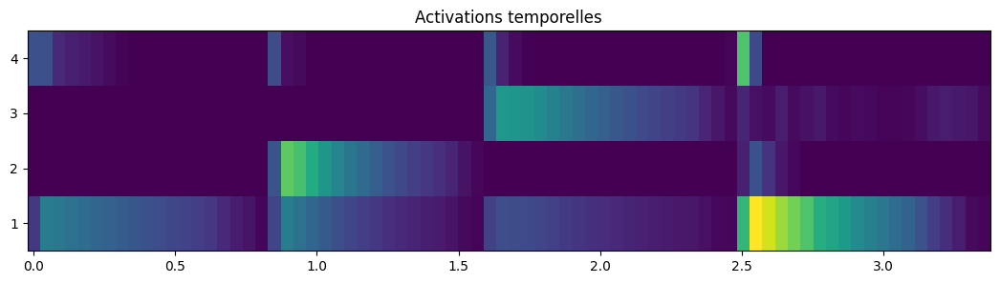

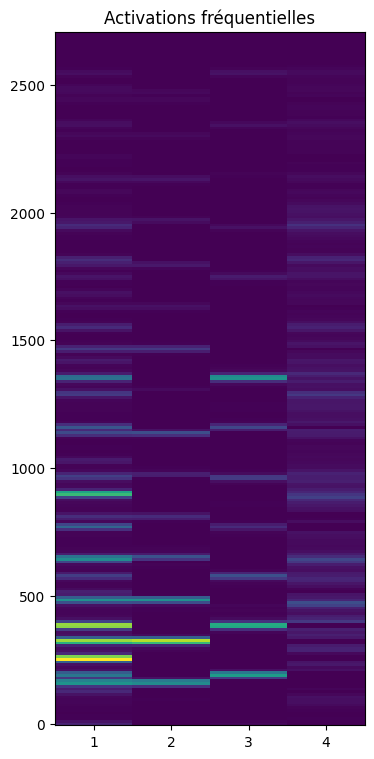

In [76]:
W_init_piano,H_init_piano = nndsvd(V_piano,S)
afficher_H(H_init_piano, tempsPiano[-1],S)
afficher_W(W_init_piano, 2700,S)

#### Voici le résultat de la NMF avec l'initialisation NNDSVD :

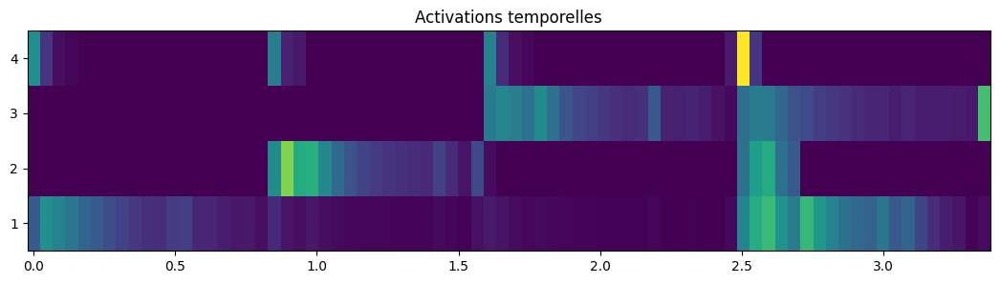

L'ordre des différentes activations temporelles dépend de l'initialisation de H
En relançant plusieurs fois cette cellule les graphique de H et W changent avec un ordre de 
lignes et colonnes différent


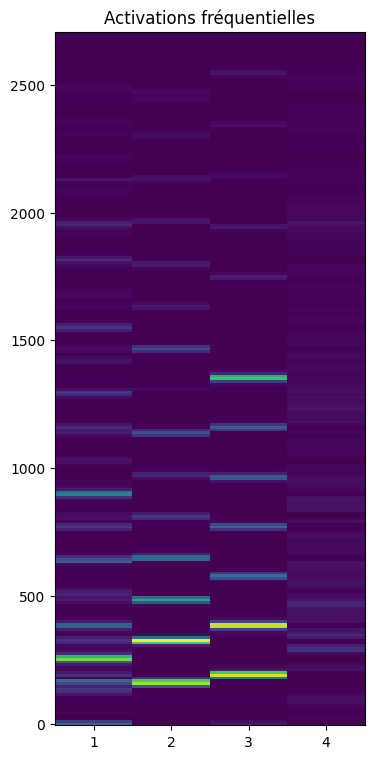

Le cout est très rapidement minimisé


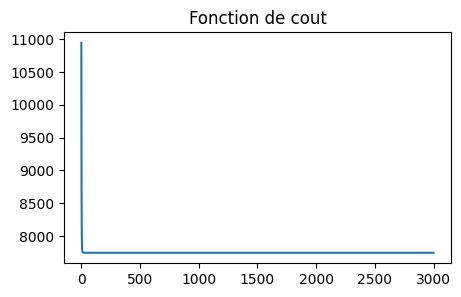

In [77]:
beta = 0 #itakura saito
S = 4

W_piano4, H_piano4, fonction_cout_init = NMF_div_init(V_piano,S,beta,0.05,3000) 
afficher_H(H_piano4, tempsPiano[-1],S)
print("L'ordre des différentes activations temporelles dépend de l'initialisation de H")
print("En relançant plusieurs fois cette cellule les graphique de H et W changent avec un ordre de \nlignes et colonnes différent")
afficher_W(W_piano4, 2700,S)
plt.figure(figsize=(5,3))
plt.plot(fonction_cout_init)
plt.title('Fonction de cout')
plt.xlabel=('Nombre d''itération')
plt.ylabel=(f"Beta Divergence for beta = {beta} ")
print("Le cout est très rapidement minimisé")

#### 6) Optimisation de cet algorithme : nombre de sources 

Finalement, une des caractéristiques à determiner lors d'une NMF est le nombre de sources que nous voulons. Dans le contexte du son, il est évident que nous souhaitons avoir autant de composantes que de sources sonores, cependant dans d'autres contexte, nous voulons savoir quelle est le nombre de sources optimal afin de garantir une bonne reconstruction du son original tout en limitant la quantité de calcul.

Encore une fois, il existe une multitude de méthode afin d'évaluer le nombre de sources optimales afin de décomposer notre son. Ici, nous allons établir une stratégie simple:


- Tracé de l'erreur de reconstruction : Nous allons exécuter l'algorithme de NMF pour différents nombres de sources (par exemple, de 1 à 10) et tracer l'erreur de reconstruction en fonction du nombre de sources.

- Méthode du coude : Chercher le point où l'erreur commence à se stabiliser (le "coude" du graphique).

- Évaluation qualitative : Écouter les sources séparées pour nous assurer qu'elles correspondent aux sources attendues et qu'elles ont un sens dans le contexte de notre application.

Ici, nous comparerons l'évolution de la norme de frobenius au cours des itérations grâce à la première fonction de la NMF que nous avons implémenté. Ensuite nous comparerons l'erreur de notre matrice de reconstruction avec la matrice initiale pour pouvoir tracer le graphique de l'erreur en fonction du nombre de sources. Pour pouvoir voir plus précisement l'évolution de l'erreur, nous ferons une centaine d'itération à chaque fois. 

In [78]:
def comparaison_range(V):
    beta = 0 #itakura saito

    cout_range = []
    cout_final = []


    for i in range(1,10):
        W = np.zeros((V.shape[0],i))
        H = np.zeros((i,V.shape[1]))
        cout = np.array([])
        S = i
        W, H,cout = multiplicative_update(V, S, 100,'fro')
        cout_range.append(cout)
        cout_final.append(1/2*np.linalg.norm(W@H-V))
    
    return(cout_range,cout_final)

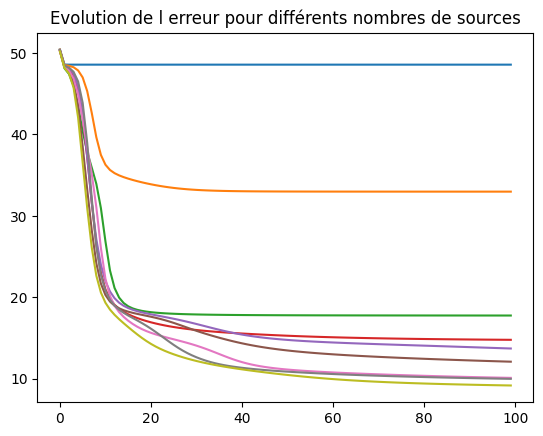

In [79]:
cout_range, cout_final = comparaison_range(V_piano)

plt.title('Evolution de l erreur pour différents nombres de sources')
plt.xlabel=('Nb itération')
plt.ylabel=('Norme entre V et WH')

for i in range(9):
    plt.plot(cout_range[i])

    

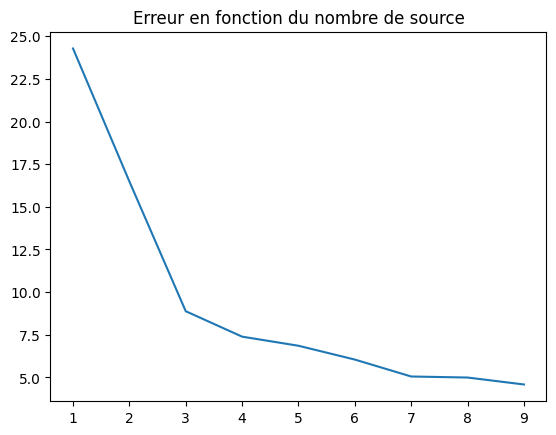

In [80]:
plt.title('Erreur en fonction du nombre de source')
plt.xlabel=('Nb sources')
plt.ylabel=('Norme entre V et WH')
plt.plot(np.linspace(1,9,9),cout_final)

Nous remarquons qu'à partir de 3 voie, l'erreur de reconstruction de la matrice initiale commence à baisser. Il n'est donc plus interessant de multiplier les sources, car cela va augmenter le nombre de calcul sans augmenter considérablement la précision. C'est plutôt logique dans le cas du piano, car nous jouons seulement trois notes différentes !

Bien que cette méthode soit simple à implémenter, il est évident que ce n'est pas une méthode acceptable. En effet, elle demande de calculer préalablement la NMF et ceci plusieurs fois ! C'est donc une méthode très coûteuse et dont le résultat est plutôt subjectif.

Nous avons donc pensé à une autre méthode qui pourrait être plus efficace et moins coûteuse. Nous pourrions utiliser la SVD et faire le calcul de la variance expliquée par les valeurs singulières afin de trouver le nombre de sources minimal pour reconstruire la matrice initiale pour une précision donnée.

Nous aurions voulu chercher et implémenter cette méthode, cependant nous n'avons pas eu le temps nécessaire.

### IV) Reconstruction du signal

#### 1) Reconstruction des sources

In [81]:
def reconstruire_sources(W, H):
    sources = []

    for i in range(W.shape[1]):
        sources.append(np.outer(W[:, i], H[i, :]))
        
    sources.append(sum(sources))
    return sources
    
def afficher_spectrogrammes_sources(sources, Fe, taille_fenetre, taille_superposee):
    fig, axes = plt.subplots(len(sources), 1, figsize=(8, 3 * len(sources))) # Spectrogrammes Plot
    
    for i, source in enumerate(sources):
        gain = librosa.amplitude_to_db(source, ref = np.max)
        
        librosa.display.specshow(gain, 
                                 x_axis = "time",
                                 y_axis = "hz",
                                 ax = axes[i],
                                 sr = Fe,
                                 hop_length = taille_superposee,
                                 cmap = None)
    plt.tight_layout()
    plt.show()

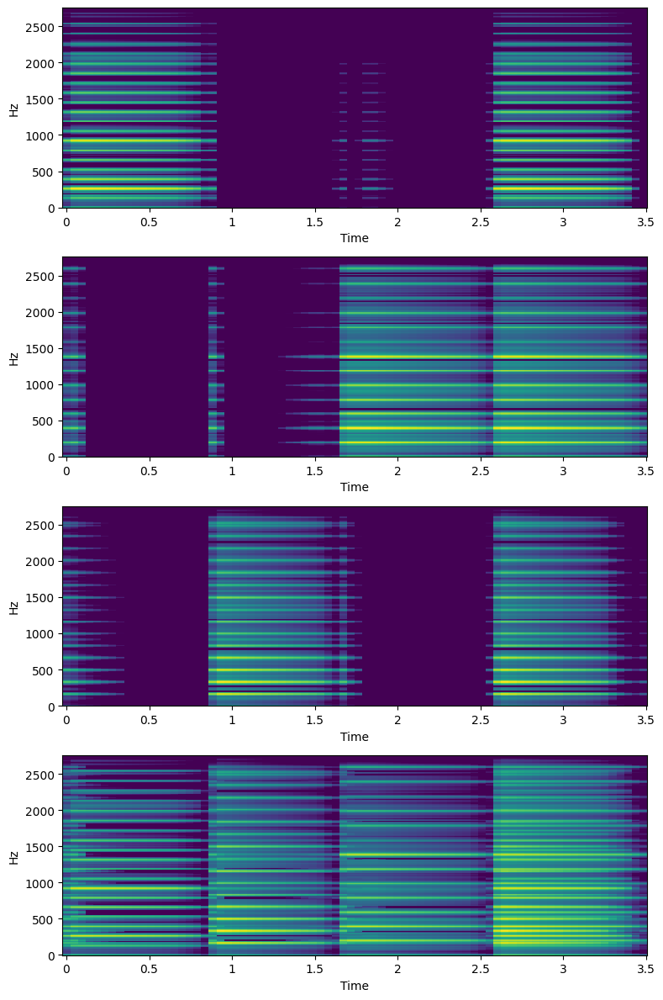

In [82]:
sources = reconstruire_sources(W_piano, H_piano) # Mettre les 2 matrices W et H issues de la décomposition
afficher_spectrogrammes_sources(sources, 5512, 512, 256)

#### 2) reconstruction du son initial

In [83]:
def normaliser_audio(audio):
    return (audio / np.max(np.abs(audio)) * 32767).astype(np.int16)

def reconstruire_audios(sources, phase, taille_fenetre, taille_superposee):
    audios_reconstruits = []

    for i, source in enumerate(sources):
        reconstruction = source * np.exp(1j * phase)

        audio = librosa.istft(reconstruction, hop_length = taille_superposee, win_length = taille_fenetre)
        
        audios_reconstruits.append(audio)

    return audios_reconstruits

def enregistrer_fichiers_audios(CHEMIN_SORTIE, nom_fichier, audios, Fe):
    for i, audio in enumerate(audios):
        chemin = f"{CHEMIN_SORTIE}/{nom_fichier}{i+1}.wav"
    
        audio = normaliser_audio(audio)
    
        write(chemin, rate = Fe, data = audio)
        print(f"Fichier audio sauvegardé ! : {chemin}")

In [84]:
audios = reconstruire_audios(sources, phase_piano, 512, 256)
enregistrer_fichiers_audios("sortiesAudio", "source", audios, Fe_piano2)

Fichier audio sauvegardé ! : sortiesAudio/source1.wav
Fichier audio sauvegardé ! : sortiesAudio/source2.wav
Fichier audio sauvegardé ! : sortiesAudio/source3.wav
Fichier audio sauvegardé ! : sortiesAudio/source4.wav


#### 3) Affichage des sons reconstruits

In [85]:
def afficher_spectres_sources(audios, Fe):
    fig, axes = plt.subplots(nrows = len(audios), ncols = 1, sharex = True, figsize = (8, len(audios) * 2))

    for i, audio in enumerate(audios):
        
        librosa.display.waveshow(audio,
                                 sr = Fe,
                                 ax = axes[i],
                                 label = f"Source {i + 1}")
        axes[i].legend()
        axes[i].set(ylabel = 'Amplitude', xlabel = 'Temps (s)')
        axes[i].grid()

    plt.tight_layout()
    plt.show()

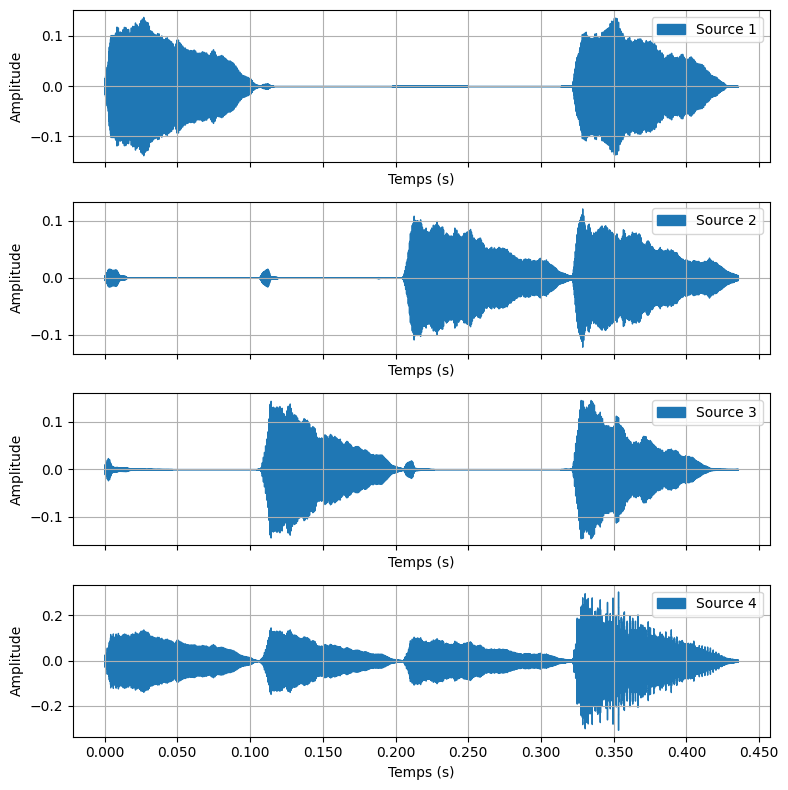

In [86]:
afficher_spectres_sources(audios, Fe_piano)

### V) Traitement des sons du sujets

Maintenant que nous avons vu et compris toutes les étapes nous permettant de résoudre le problème de décomposition de sources, voici une fonction générale qui nous permet d'afficher toutes les étapes de cette décomposition pour n'importe quel son. Afin de garantir un résultat cohérent et correct, nous avons décidé d'utiliser la fonction de scipy pour réaliser la NMF.  
Les sources individuelles décomposées puis reconstruites sont enregistrées dans *CHEMIN_SORTIE/*. Il faut également savoir que pour *nb_sources* données, *nb_sources + 1* sources sont reconstruites, la dernière correspondant à l'audio final reconstruit, à partir de la concaténation de l'ensemble des sources extraites.

> **PS** :  
> - **Attention au chemin d'entrée, actuellement défini par *CHEMIN_ENTREE/nom_fichier.wav*.**  
> - **Attention au chemin de sortie, actuellement défini par *CHEMIN_SORTIE/source{num}.wav*.**  
> - **Soyez patient, il faut plusieurs secondes pour certaines recompositions.**

In [87]:
def auto_decomposition_complete(nom_fichier, nb_sources, taille_fenetre, taille_superposition, limite_y, Fe):

    #charger le son
    CHEMIN_ENTREE = "sourcesAudio"
    CHEMIN_SORTIE = "sortiesAudio"
    data_son, Fe_son = librosa.load(f"{CHEMIN_ENTREE}/{nom_fichier}.wav", sr = Fe)
    temps = np.linspace(0, data_son.size / Fe_son, data_son.size)
    
    #afficher le son
    fig, ax = plt.subplots(1, 1, figsize=(10, 3))
    librosa.display.waveshow(data_son, sr=Fe_son, ax=ax,axis='time')
    ax.set(title='Son', xlabel='Temps (s)', ylabel='Amplitude')
    plt.show()
    
    #spectrogramme
    stft_son, V_son, phase_son, gain_son = spectrogramme_librosa(data_son, Fe_son, taille_fenetre, taille_superposition, limite_y)
    
    #NMF initialisation aleatoire
    print("Initialisation aleatoire pour la NMF")
    W_rand, H_rand = initialisation_aleatoire(V_son, nb_sources)
    afficher_H(H_rand, temps[-1], nb_sources)
    afficher_W(W_rand, limite_y, nb_sources)
    
    #Initialisation NNDSVD
    print("Initialisation NNDSVD pour la NMF")
    W_init_son, H_init_son = nndsvd(V_son, nb_sources)
    afficher_H(H_init_son, temps[-1], nb_sources)
    afficher_W(W_init_son, limite_y, nb_sources)
    
    #Application de la NMF
    print("Resultat de la NMF")
    model = NMF(n_components = nb_sources, init='nndsvd', beta_loss='frobenius',random_state=42)
    W_son = model.fit_transform(V_son)
    H_son = model.components_
    afficher_H(H_son, temps[-1], nb_sources)
    afficher_W(W_son, limite_y, nb_sources)
    
    #erreur qui diminue
    cout_range, cout_final = comparaison_range(V_son)
    plt.title('Erreur en fonction du nombre de source')
    plt.xlabel=('Nb sources')
    plt.ylabel=('Norme entre V et WH')
    plt.plot(np.linspace(1, len(cout_final), len(cout_final)), cout_final)
    
    #affichage des spectrogrammes separes
    sources = reconstruire_sources(W_son, H_son)
    afficher_spectrogrammes_sources(sources, Fe_son, taille_fenetre, taille_superposition)
    
    #affichage des sons separes
    audios = reconstruire_audios(sources, phase_son, taille_fenetre, taille_superposition)
    afficher_spectres_sources(audios, Fe_son)
    
    #enregistrement sources sonores individuelles
    enregistrer_fichiers_audios(CHEMIN_SORTIE, nom_fichier, audios, Fe_son)

A présent, nous pouvons traiter les différents sons du sujet.

#### Audio Piano

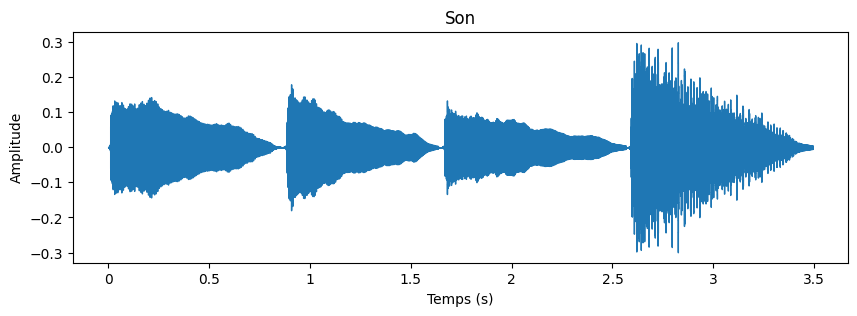

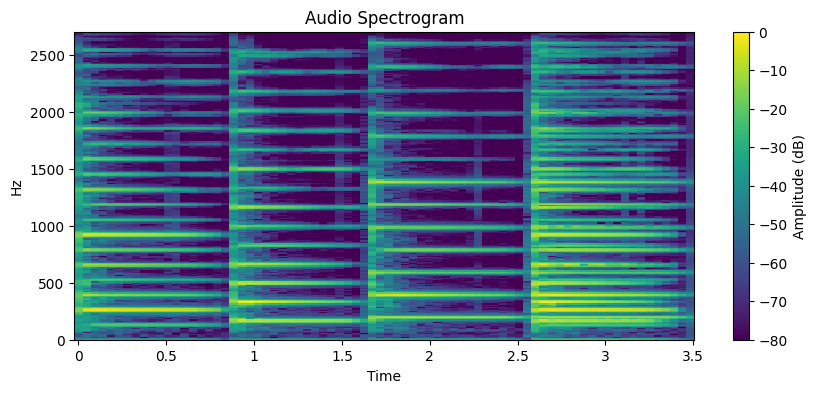

Initialisation aleatoire pour la NMF


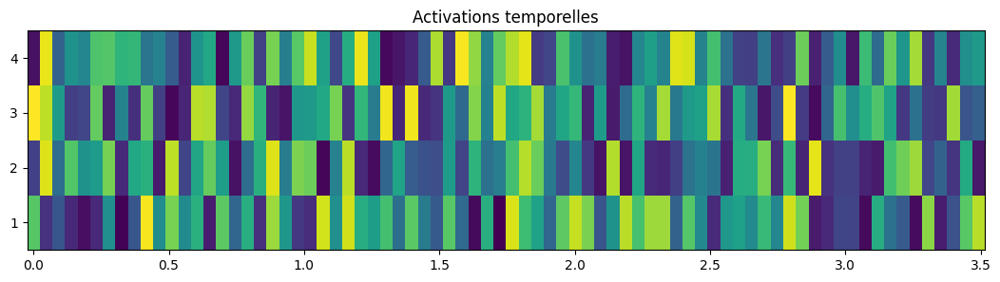

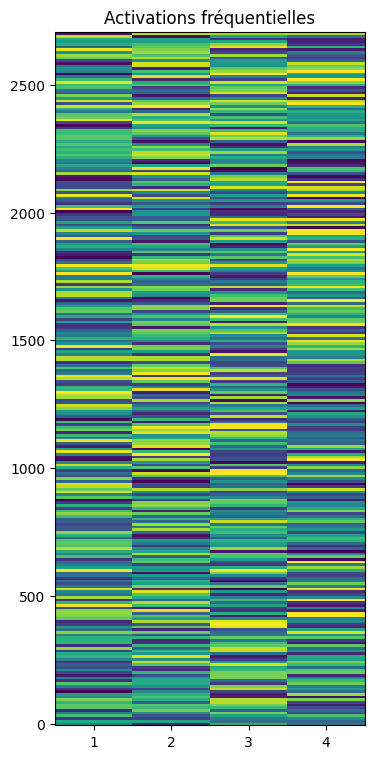

Initialisation NNDSVD pour la NMF


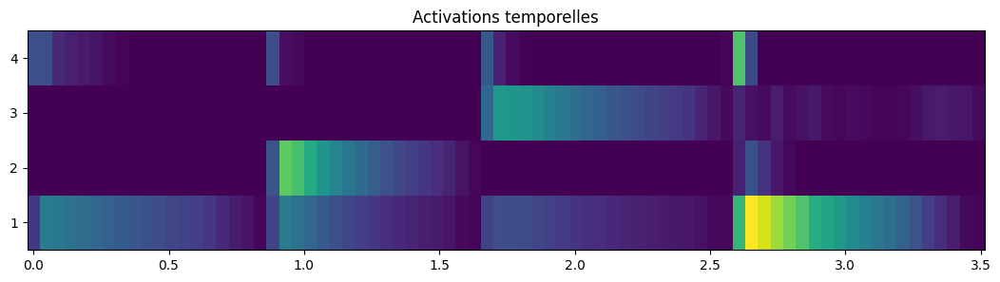

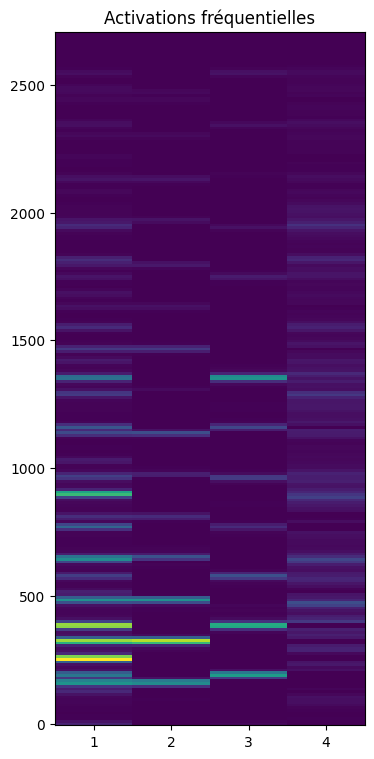

Resultat de la NMF


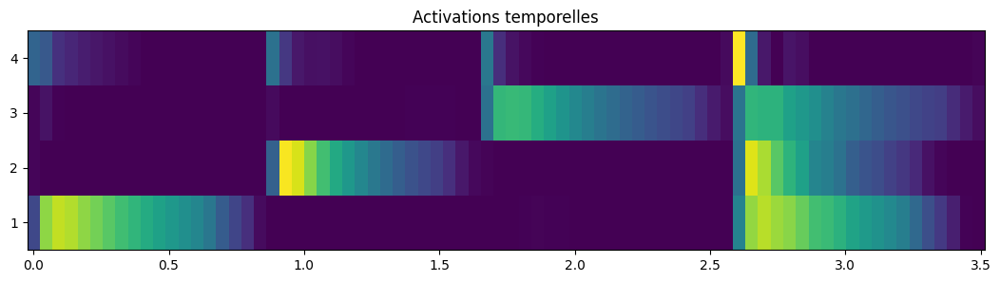

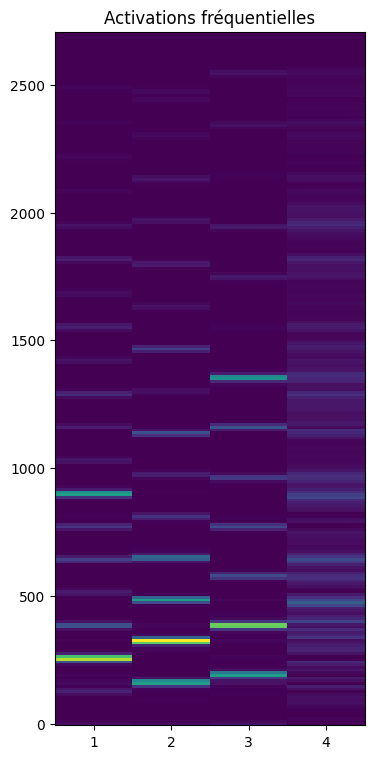

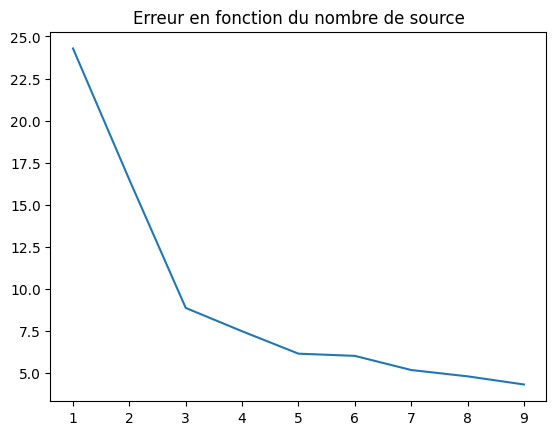

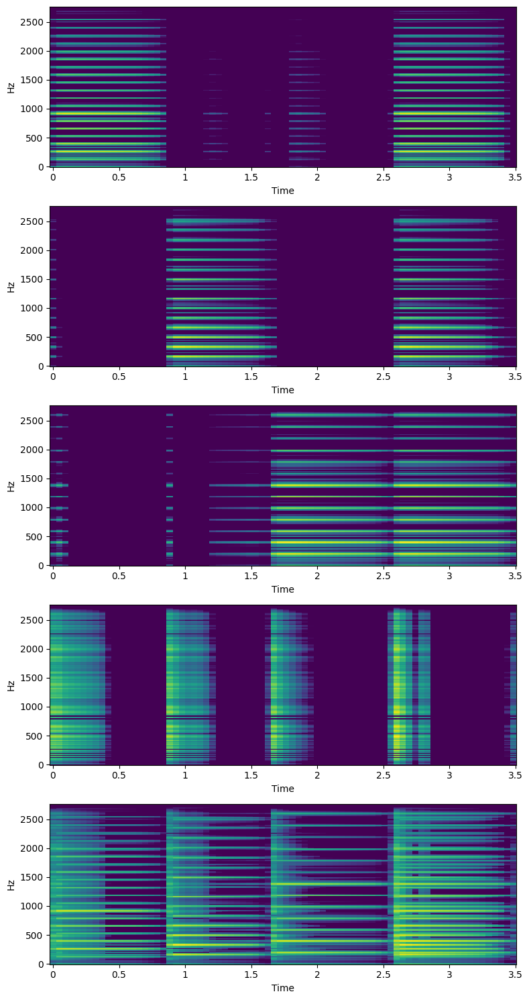

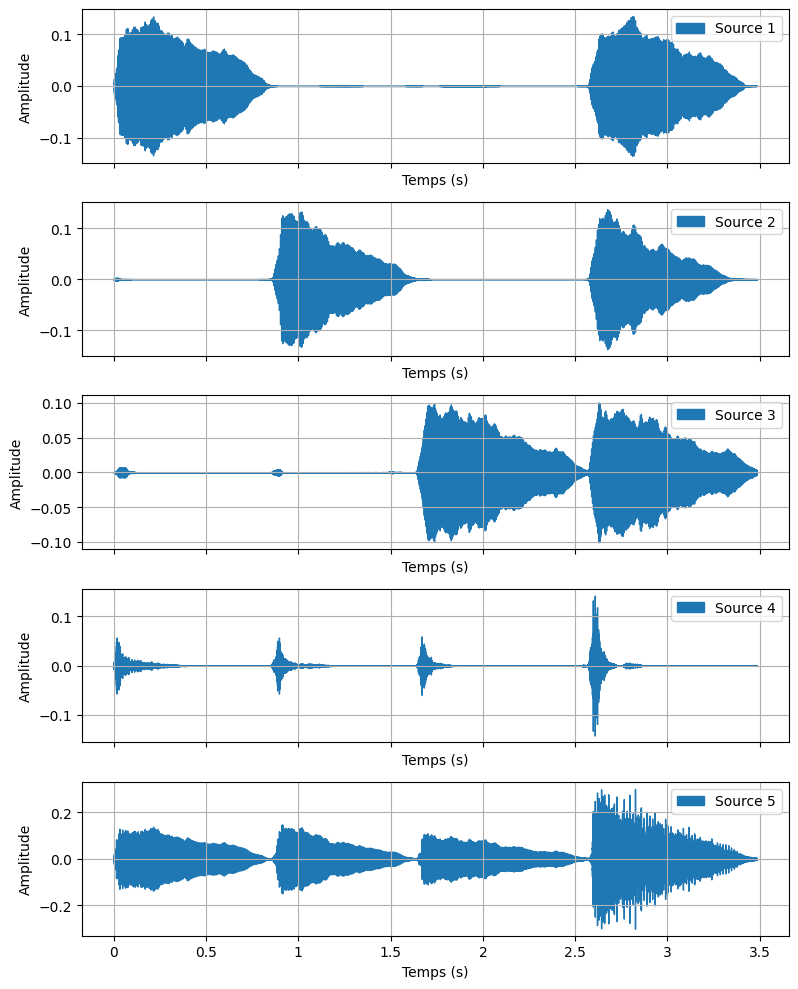

Fichier audio sauvegardé ! : sortiesAudio/piano_mix1.wav
Fichier audio sauvegardé ! : sortiesAudio/piano_mix2.wav
Fichier audio sauvegardé ! : sortiesAudio/piano_mix3.wav
Fichier audio sauvegardé ! : sortiesAudio/piano_mix4.wav
Fichier audio sauvegardé ! : sortiesAudio/piano_mix5.wav


In [88]:
auto_decomposition_complete("piano_mix", 4, 512, 256, 2700, 5512)

#### Audio Cheval et Chat

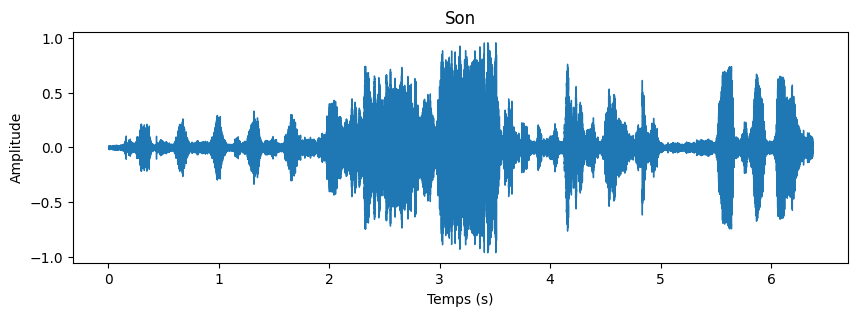

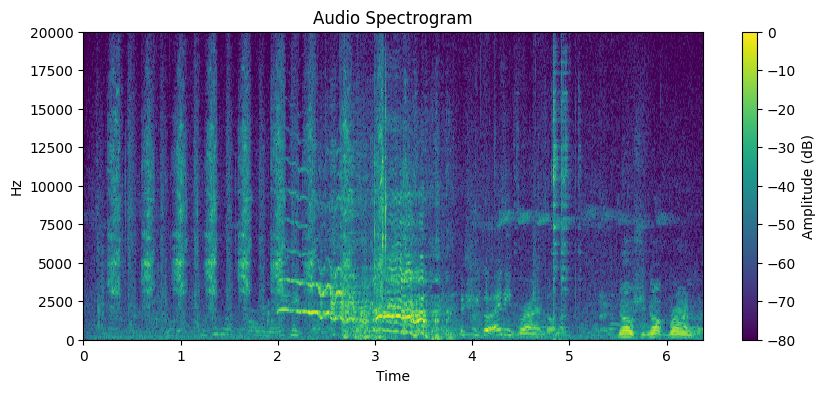

Initialisation aleatoire pour la NMF


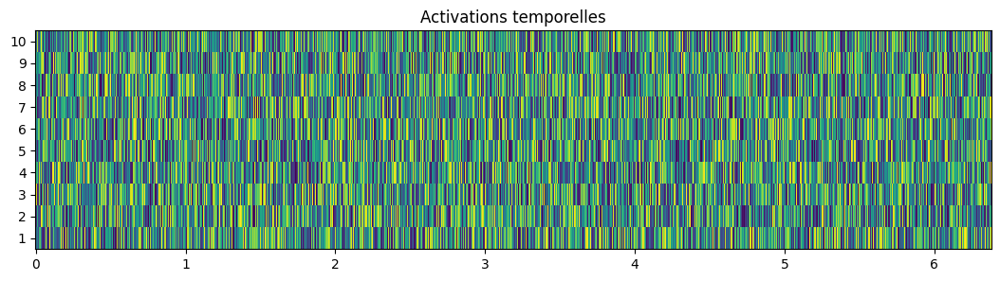

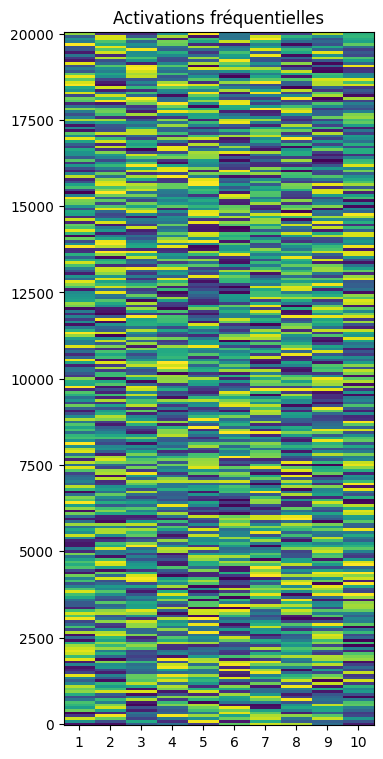

Initialisation NNDSVD pour la NMF


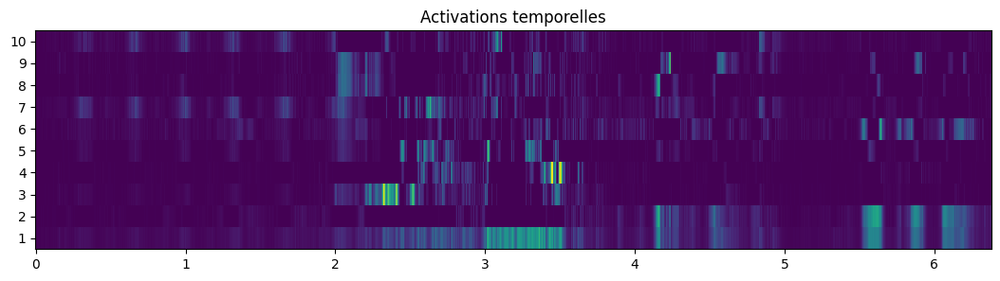

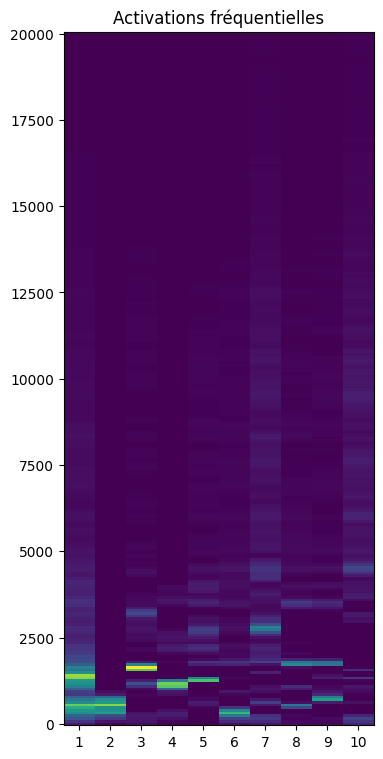

Resultat de la NMF


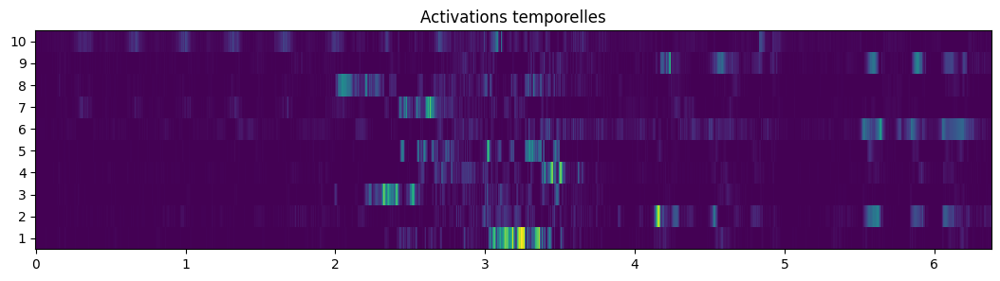

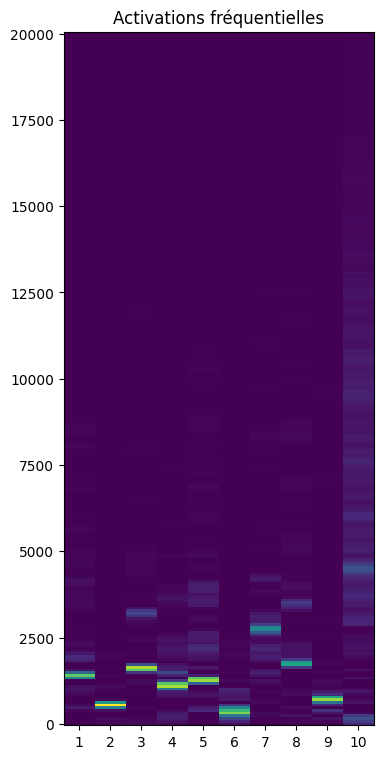

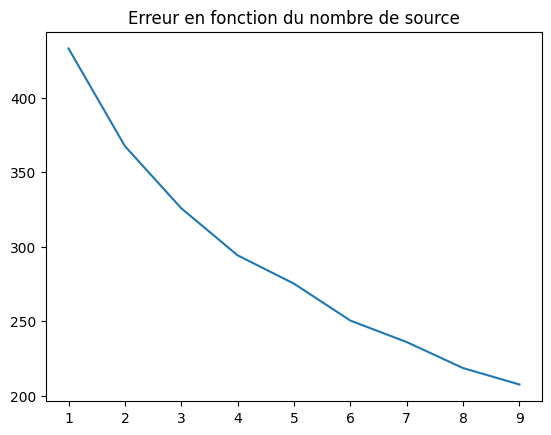

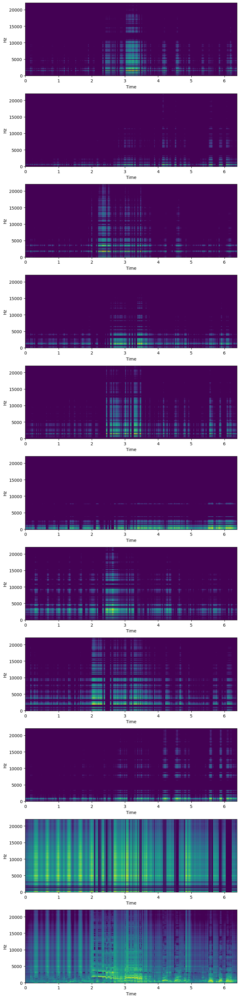

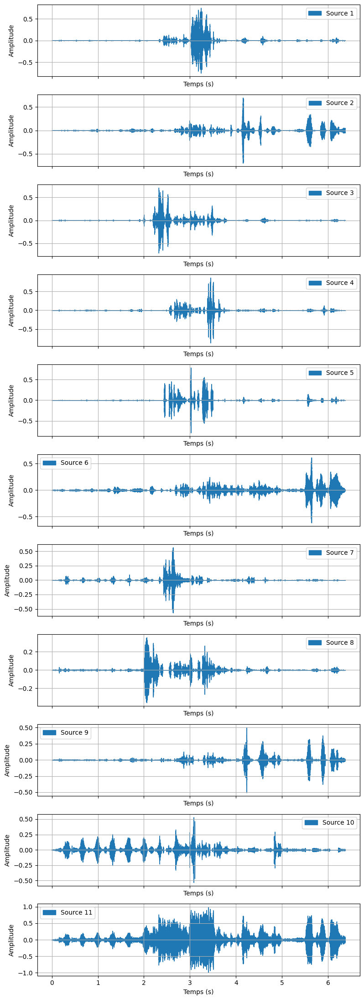

Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat1.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat2.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat3.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat4.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat5.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat6.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat7.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat8.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat9.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat10.wav
Fichier audio sauvegardé ! : sortiesAudio/horse_and_chat11.wav


In [89]:
auto_decomposition_complete("horse_and_chat", 10, 512, 256, 20000, 44100)

#### Audio Violon

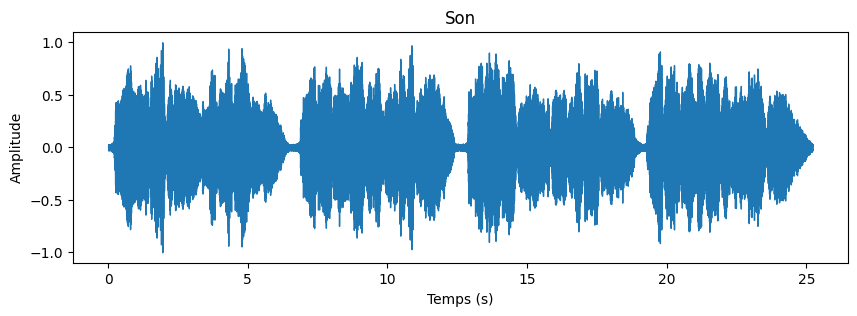

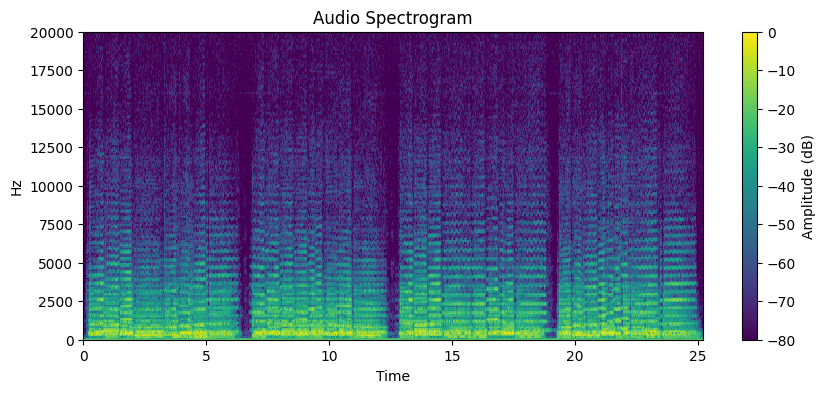

Initialisation aleatoire pour la NMF


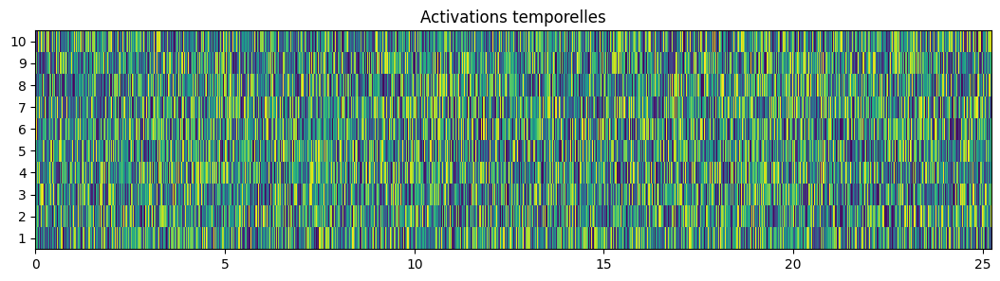

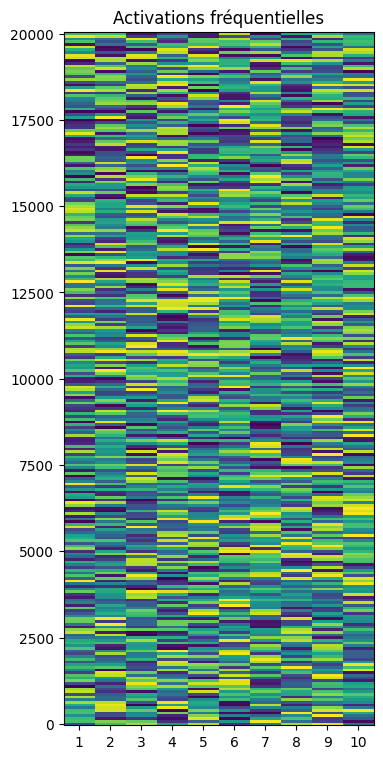

Initialisation NNDSVD pour la NMF


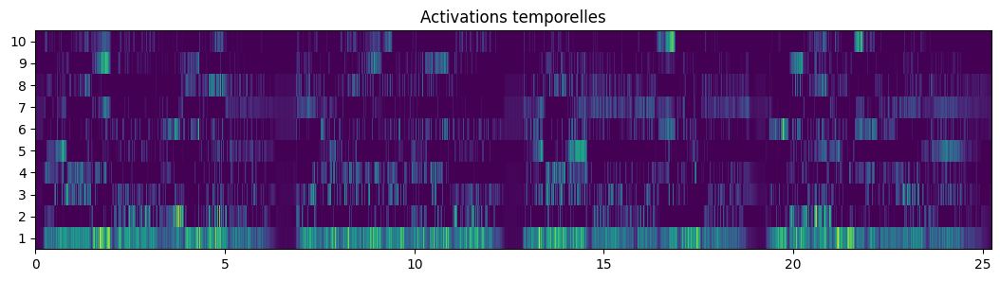

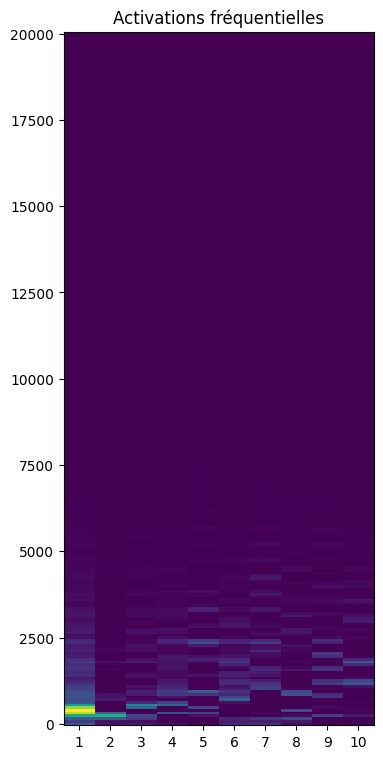

Resultat de la NMF


/home/llenoble/.local/share/virtualenvs/24-25-pi-autodecomp-13-GvSjI_sm/lib/python3.12/site-packages/sklearn/decomposition/_nmf.py:1728: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


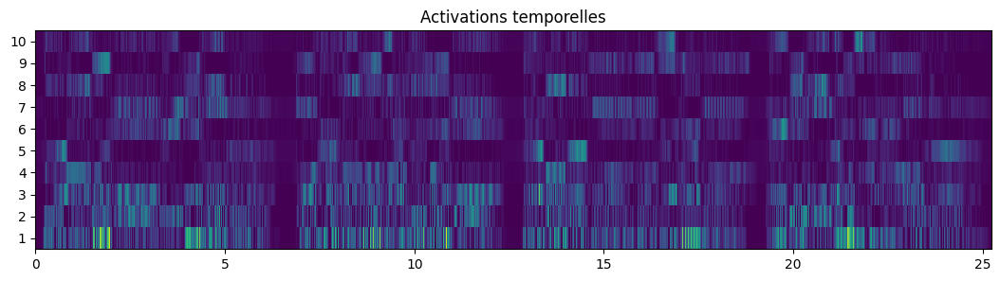

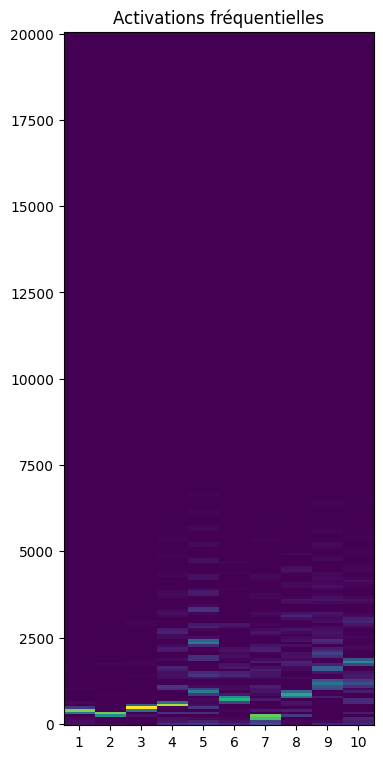

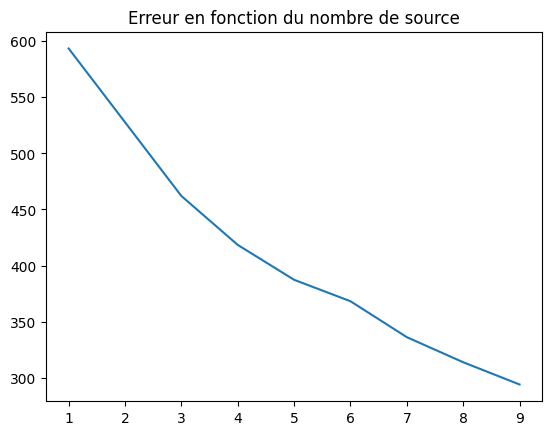

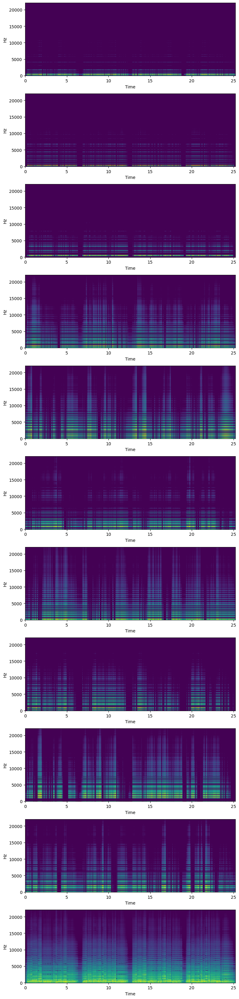

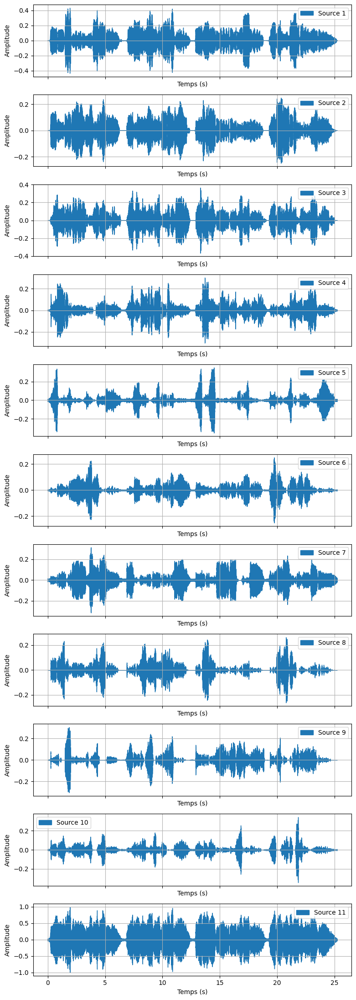

Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr1.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr2.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr3.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr4.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr5.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr6.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr7.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr8.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr9.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr10.wav
Fichier audio sauvegardé ! : sortiesAudio/01-AchGottundHerr11.wav


In [90]:
auto_decomposition_complete("01-AchGottundHerr", 10, 512, 256, 20000, 44100)

### VI) Conclusion

#### 1) Résultats obtenus

Les résultats que nous obtenons sont plutôt cohérents et étaient prévisibles. En effet, le son du piano est bien décomposé car ce sont des notes distinctes et dont les fréquences ne varient pas. Nous pouvons alors décomposé facilement ces trois notes. En ce qui concerne le son du violon, nous parvenons à séparer des groupes de fréquences. En écoutant les sources indépendentes, nous remarquons bien les activations de ces notes. Finalement, pour le son du cheval et des discussions, c'est une tâche bien plus complexe. En effet, que ce soit le cheval ou les voies, les fréquences sont parfois similaires. Ainsi, la décomposition n'arrive pas à distiguer de différence entre le son du cheval et des personnes aux alentours. Cette méthode montre alors des limites quant à la séparation de sources. Elle conviendra alors pour une séparation de fréquences distinctes, mais pas à la séparation de voies multiples. Nous ne pourrions donc pas l'utiliser pour des traitements dans l'audio visuel par exemple.

#### 2)  Compétences acquises

Ce projet nous aura permis d'acquérir de nombreuses compétences de groupe et individuelles, mais aussi beaucoup de connaissances.

En effet, celui-ci utilise un large pannel d'outils et de méthodes de travail indispensable pour un ingénieur. Bien que cette première expérience n'aie pas toujours été parfaitement réalisée, elle aura été très enrichissante et nous aura permis de nous projeter plus concrètement sur le travail que nous auront à effectuer, et les diffcultés que nous rencontrerons, dans les années à venir.

Finalement, nous avons appris à représenter et gérer les paramètres d’un spectrogramme grâce à la STFT et aux ondelettes, mais aussi à trouver la méthode la plus adaptée afin de factoriser notre matrice. De plus, nous avons eu l'occasion de comprendre comment initialiser correctement nos matrices grâce à différentes méthodes plus ou moins complexes. Enfin, nous avons compris comment implémenter ces techniques en python afin d’obtenir le résultat recherché.

### VII) Sources

Les cours d'ananums en général ont été utilisés

https://www.youtube.com/watch?v=o4pPTwsd-5M

https://www.math.univ-toulouse.fr/~besse/Wikistat/pdf/st-m-explo-nmf.pdf

https://fr.wikipedia.org/wiki/Algorithme_du_gradient

https://moodle.insa-rouen.fr/mod/resource/view.php?id=7490

https://moodle.insa-rouen.fr/pluginfile.php/231759/mod_resource/content/1/cours10-ondelettes_perrier_short.pdf

https://arxiv.org/pdf/2109.03874#cite.Xue08